In [1]:
"""
jupyter-nbconvert report_common_subspace.ipynb --to python; python -u report_common_subspace.py

"""

'\njupyter-nbconvert report_common_subspace.ipynb --to python; python -u report_common_subspace.py\n\n'

In [2]:
from __future__ import division
import os
import glob
import pickle
from natsort import natsorted
import argparse
import os
import sys
import numpy as np
import tqdm
import pandas as pd

import scipy as sp
import numpy as np
from pprint import pprint
import glob
import sys
sys.path.append('../')
from plume_env import PlumeEnvironment, PlumeFrameStackEnvironment
import config
import agents
import agent_analysis
import os
import sklearn
import sklearn.decomposition as skld

import importlib
import sim_analysis
import log_analysis
importlib.reload(log_analysis)

import config
np.random.seed(config.seed_global)

In [3]:
import sys
batchmode = False
if 'ipykernel_launcher' in sys.argv[0]:
    print("Interactive mode")
else:
    batchmode = True
    print("Batch/CLI mode")
    import argparse

Interactive mode


In [4]:
# Common
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

from IPython.display import clear_output
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches



import seaborn as sns
sns.set(style="white")
# print(plt.style.available)

mpl.rcParams['figure.dpi'] = 100
dpi_save = 300
font = {'family' : 'serif',
        'weight' : 'normal',
        'size'   : 10}
matplotlib.rc('font', **font)

# Interactive vs. CLI
if not batchmode:
    %matplotlib inline
    # %config InlineBackend.figure_format = 'svg'
    %config InlineBackend.figure_format = 'retina'
if batchmode:
    matplotlib.use("Agg")
    
pca3d_figsize=(10,5)

In [5]:
# # Do this at the end to get things to work
# import matplotlib
# import matplotlib.pyplot as plt
# import matplotlib as mpl


# import seaborn as sns
# from mpl_toolkits.axes_grid1 import make_axes_locatable

# from IPython.display import clear_output
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D


# %matplotlib inline
# # %config InlineBackend.figure_format = 'svg'
# %config InlineBackend.figure_format = 'retina'


# import seaborn as sns
# sns.set(style="white")
# print(plt.style.available)
# # plt.style.use('seaborn-ticks')

# # sns.set_context("paper", rc={"font.size":10,"axes.titlesize":10,"axes.labelsize":9})   


# mpl.rcParams['figure.dpi'] = 100
# font = {'family' : 'serif',
#         'weight' : 'normal',
#         'size'   : 18}
# matplotlib.rc('font', **font)
# # plt.rcParams["font.family"] = "Times New Roman"

In [6]:
# Common
importlib.reload(config)
outcome_colormap = config.outcome_colormap
regime_colormap = config.regime_colormap

# https://seaborn.pydata.org/generated/seaborn.set_color_codes.html#seaborn.set_color_codes
sns.color_palette()
sns.set_color_codes(palette='deep')

In [7]:
if batchmode:
    parser = argparse.ArgumentParser(description='')
    parser.add_argument('--model_fname', default=None)
#     parser.add_argument('--datasets', type=str, nargs='+',
#             default=['constantx5b5', 'switch45x5b5', 'noisy3x5b5'])
#     parser.add_argument('--dataset', type=str, default='constantx5b5')
    args = parser.parse_args()
    print(args)

    model_fname = args.model_fname

In [8]:
if not batchmode: # Interactive
    model_fname = natsorted(glob.glob(f'/home/satsingh/plume/plumezoo/latest/fly/memory/*VRNN*.pt'))[0]
#     model_fname = natsorted(glob.glob(f'/home/satsingh/plume/plumezoo/dynamic/fly/memory/*VRNN*.pt'))[0]



In [9]:
model_dir = model_fname.replace('.pt', '/')
print("model_dir", model_dir)

model_seed = model_dir.split('seed')[-1].split('/')[0]
print("model_seed ---->", model_seed)

outdir = f"{model_dir}/report_common_subspace/"
indir = f'{model_dir}/report_arch/' # to get best_window_lengths from report_correlations
os.makedirs(outdir, exist_ok=True)
print(outdir)

is_recurrent = True if ('GRU' in model_dir) or ('VRNN' in model_dir) else False

logfiles = natsorted(glob.glob(model_dir + '*.pkl'))
[ x.split('/')[-1] for x in logfiles ]

model_dir /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9/
model_seed ----> 3307e9
/home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace/


['constantx5b5.pkl',
 'constantx5b5_0.2.pkl',
 'constantx5b5_0.4.pkl',
 'constantx5b5_0.6.pkl',
 'constantx5b5_0.8.pkl',
 'noisy3x5b5.pkl',
 'noisy6x5b5.pkl',
 'switch15x5b5.pkl',
 'switch30x5b5.pkl',
 'switch45x5b5.pkl']

In [10]:
# use_datasets = ['constantx5b5', 'switch45x5b5', 'noisy6x5b5']
use_datasets = ['constantx5b5', 'switch45x5b5', 'noisy3x5b5']
selected_df = log_analysis.get_selected_df(model_dir, 
                              use_datasets, 
                              n_episodes_home=60, 
                              n_episodes_other=60,
                              min_ep_steps=0)
print(selected_df.shape)
selected_df

(298, 5)


,dataset,idx,ep_length,log,outcome
3,constantx5b5,82,285,"{'trajectory': [[6.089736038791369, 0.00960661...",HOME
7,constantx5b5,97,276,"{'trajectory': [[5.948685860931586, 0.05904046...",HOME
8,constantx5b5,102,275,"{'trajectory': [[5.942676230501777, 0.03266931...",HOME
9,constantx5b5,236,275,"{'trajectory': [[8.044839745325845, -0.4675270...",HOME
10,constantx5b5,92,275,"{'trajectory': [[5.991609051625939, 0.09911625...",HOME
...,...,...,...,...,...
319,noisy3x5b5,27,52,"{'trajectory': [[3.984323325354093, 0.58274205...",OOB
320,noisy3x5b5,33,52,"{'trajectory': [[4.034063828657129, 0.68613060...",OOB
321,noisy3x5b5,23,51,"{'trajectory': [[3.941389059537711, 0.73158124...",OOB
322,noisy3x5b5,100,50,"{'trajectory': [[5.941629538577946, 0.93596513...",OOB


In [11]:
selected_df.groupby(['dataset', 'outcome']).count()

idx  ep_length  log
dataset      outcome                     
constantx5b5 HOME      33         33   33
             OOB       33         33   33
noisy3x5b5   HOME      56         56   56
             OOB       56         56   56
switch45x5b5 HOME      60         60   60
             OOB       60         60   60

In [12]:
# def outcome_df(episode_logs):
#     episodes_df = []
#     for idx in range(len(episode_logs)):
#         log = episode_logs[idx]
#         episodes_df.append({
#                             'idx': idx,
#                             'log': log,
#                             'outcome': log['infos'][-1][0]['done'],
#                            })
#     episodes_df = pd.DataFrame(episodes_df)
#     return episodes_df

# episodes_df = outcome_df(episode_logs)
# episodes_df = episodes_df.sample(frac=1).reset_index(drop=True) # shuffle
# episodes_df = episodes_df.groupby(['outcome']).head(5)
# episodes_df


In [13]:
pca_common = log_analysis.get_pca_common(selected_df, 
                            n_comp=15, 
                            is_recurrent=is_recurrent)
with open(f"{outdir}/pca_common.pkl", 'wb') as file:
    pickle.dump(pca_common, file)

[4]
Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//scree_3307e9.png


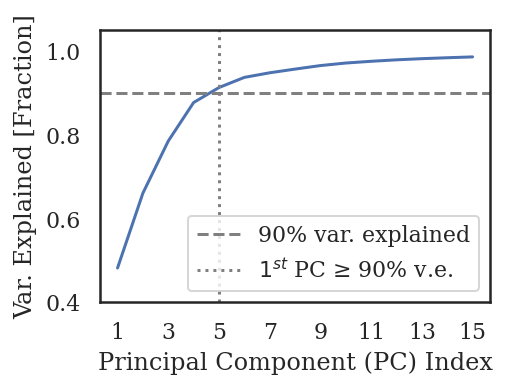

In [14]:
# def plot_scree(pca_common):
cum_evr=np.cumsum(pca_common.explained_variance_ratio_)
n_comp=len(pca_common.explained_variance_ratio_)

fig = plt.figure(figsize=(3.5,2.5))
plt.plot(cum_evr)
ax = plt.gca()
ax.set_xticks(np.arange(n_comp, step=2, dtype=int));
ax.set_xticklabels(np.arange(n_comp, step=2, dtype=int) + 1);
ax.axhline(0.90, ls='--', c='grey', label='90% var. explained')
plt.ylim(0.4, 1.05)

pc_over = np.argwhere(list(cum_evr >= 0.9))[0]
print(pc_over)
ax.axvline(pc_over, ls=':', c='grey', label='$1^{st}$ PC ≥ 90% v.e.')

plt.legend(loc='lower right')
plt.xlabel("Principal Component (PC) Index")
plt.ylabel("Var. Explained [Fraction]")

# if not batchmode:
#     plt.title(model_seed)

fname = f"{outdir}/scree_{model_seed}.png"
print("Saving:", fname)
plt.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True)

# plot_scree(pca_common)

In [15]:
# import umap
# pca_common = umap.UMAP(n_components=3)
# pca_common.fit(h_episodes_stacked)
# X_transformed = pca_common.fit_transform(X)
# X_transformed.shape

# import cudf
# import cuml
# pca_common = cuml.UMAP(
#     n_neighbors=15,
#     n_components=3,
#     n_epochs=500,
#     min_dist=0.1
# )
# pca_common = reducer.fit(h_episodes_stacked)

In [16]:
# # generate animations
# for idx, row in selected_df[:3].iterrows():
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#                 extended_metadata=False, squash_action=squash_action, seed=model_seed)
#     episode_idx = row['idx']
#     OUTPREFIX = 'test'
    
#     try:
#         log_analysis.animate_activity_1episode(ep_activity, 
#                 traj_df, 
#                 episode_idx, 
#                 fprefix=dataset,
#                 outprefix=OUTPREFIX,
#                 pca_dims=3,
#                 pca_common=pca_common)
#     except Exception as e:
#         print(f"Exception: {e}")

In [17]:
from pathlib import Path
import json
json_fname = f"{indir}/best_window_lengths_{model_seed}.json"
best_window_lengths = {'odor_ma': 10, 'odor_ewm': 10, 'odor_enc': 10} # defaults
if Path(json_fname).is_file():
    with open(json_fname, 'r') as fp:
        best_window_lengths = json.load(fp)
    
print(best_window_lengths)

{'odor_ma': 6, 'odor_ewm': 8, 'odor_enc': 46}


seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


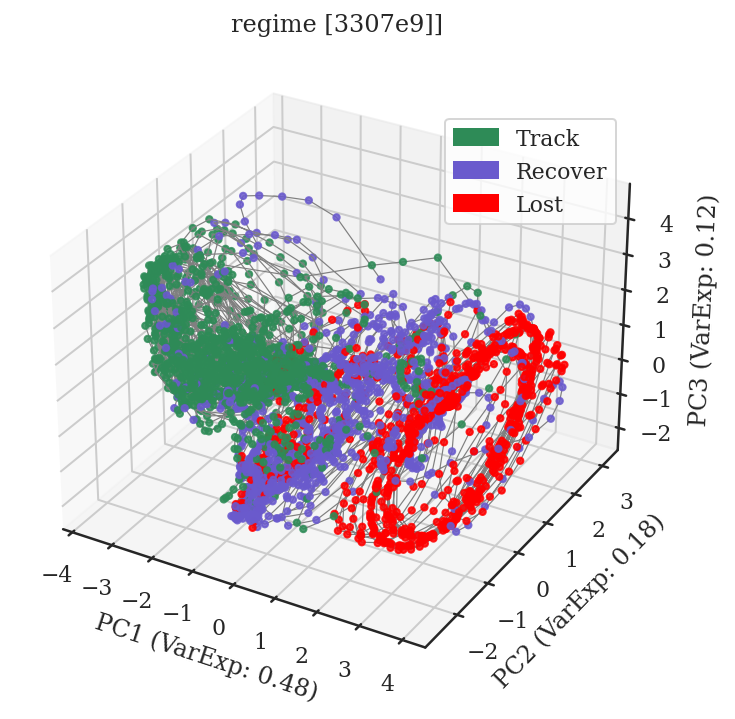

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_regime_3307e9.png
best odor_ma_6 odor_ma
seed specific thresholds 12 35
odor_ma_6 0.0 1.0
seed specific thresholds 12 35
odor_ma_6 0.0 0.8333333333333334
seed specific thresholds 12 35
odor_ma_6 0.0 0.7831024148811897
seed specific thresholds 12 35
odor_ma_6 0.0 0.8333333333333334
seed specific thresholds 12 35
odor_ma_6 0.0 0.666219562292099
seed specific thresholds 12 35
odor_ma_6 0.0 1.0
seed specific thresholds 12 35
odor_ma_6 0.0 0.02673735624800126
seed specific thresholds 12 35
odor_ma_6 0.0 0.061034939562280975
seed specific thresholds 12 35
odor_ma_6 0.0 0.0
seed specific thresholds 12 35
odor_ma_6 0.0 0.0
seed specific thresholds 12 35
odor_ma_6 0.0 0.8333333333333334
seed specific thresholds 12 35
odor_ma_6 0.0 0.8333333333333334
seed specific thresho

<Figure size 432x288 with 0 Axes>

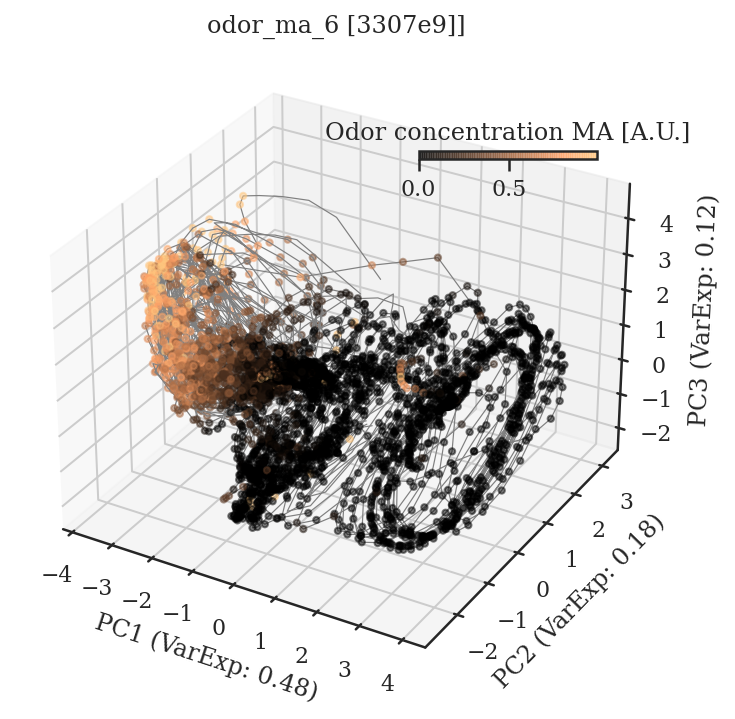

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_odor_ma_6_3307e9.png
best odor_ewm_8 odor_ewm
seed specific thresholds 12 35
odor_ewm_8 0.03621104751697413 1.0
seed specific thresholds 12 35
odor_ewm_8 0.0 0.7716878118814842
seed specific thresholds 12 35
odor_ewm_8 0.0 0.7159961115433584
seed specific thresholds 12 35
odor_ewm_8 0.0 0.7735036605698645
seed specific thresholds 12 35
odor_ewm_8 0.0 0.6018414176541685
seed specific thresholds 12 35
odor_ewm_8 3.51571720593391e-14 1.0
seed specific thresholds 12 35
odor_ewm_8 0.0 0.03565177333357208
seed specific thresholds 12 35
odor_ewm_8 0.0 0.04231485869328415
seed specific thresholds 12 35
odor_ewm_8 0.0 0.0
seed specific thresholds 12 35
odor_ewm_8 0.0 0.0
seed specific thresholds 12 35
odor_ewm_8 0.0 0.7207847234800653
seed specific thresholds 12 35
odor_

<Figure size 432x288 with 0 Axes>

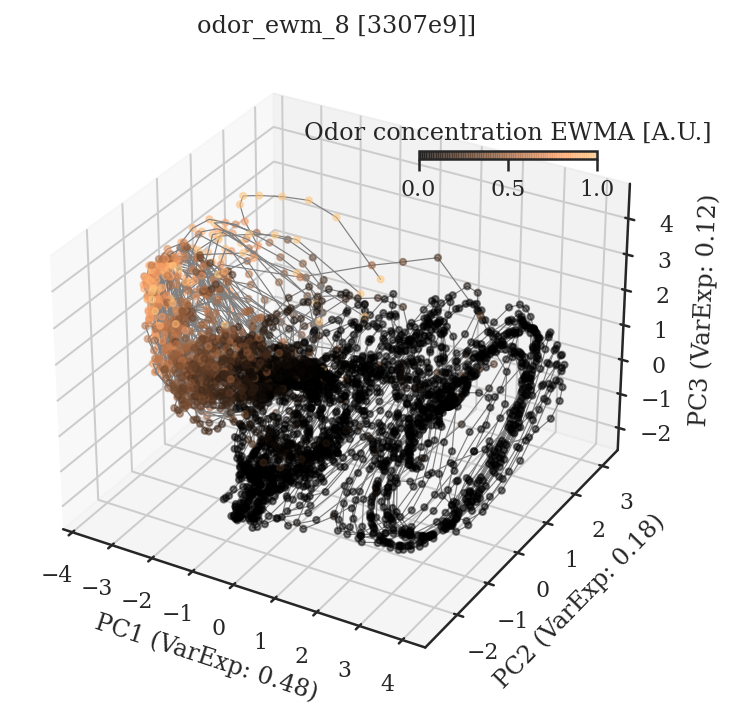

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_odor_ewm_8_3307e9.png
best odor_enc_46 odor_enc
seed specific thresholds 12 35
odor_enc_46 0.0 5.885715733334492
seed specific thresholds 12 35
odor_enc_46 0.0 4.188168872928796
seed specific thresholds 12 35
odor_enc_46 0.0 2.9150409504534345
seed specific thresholds 12 35
odor_enc_46 0.0 4.485694653574749
seed specific thresholds 12 35
odor_enc_46 0.0 5.096047004392179
seed specific thresholds 12 35
odor_enc_46 0.0 1.0664708059398595
seed specific thresholds 12 35
odor_enc_46 0.0 6.663384917130475
seed specific thresholds 12 35
odor_enc_46 0.0 2.3138013386949834
seed specific thresholds 12 35
odor_enc_46 0.0 0.0
seed specific thresholds 12 35
odor_enc_46 0.0 0.0
seed specific thresholds 12 35
odor_enc_46 0.0 5.0697910741396655
seed specific thresholds 12 35
od

<Figure size 432x288 with 0 Axes>

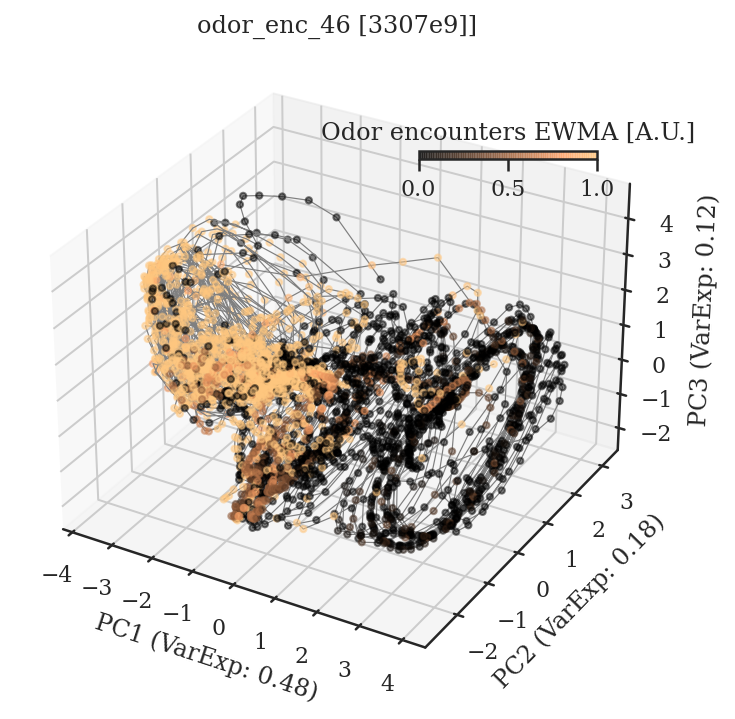

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_odor_enc_46_3307e9.png
seed specific thresholds 12 35
agent_angle_ground 0.0013622529804705463 0.9986169189214706
seed specific thresholds 12 35
agent_angle_ground 0.003342553973197937 0.9981119334697723
seed specific thresholds 12 35
agent_angle_ground 1.1838972568678496e-05 0.9987974762916567
seed specific thresholds 12 35
agent_angle_ground 0.004959177225828115 0.9976389370858669
seed specific thresholds 12 35
agent_angle_ground 4.530325531959534e-05 0.999747283756733
seed specific thresholds 12 35
agent_angle_ground 0.008233904838562067 0.9984978288412094
seed specific thresholds 12 35
agent_angle_ground 0.011618871241808049 0.9886452704668045
seed specific thresholds 12 35
agent_angle_ground 0.007352616637945064 0.9791532009840012
seed specific thresholds 1

<Figure size 432x288 with 0 Axes>

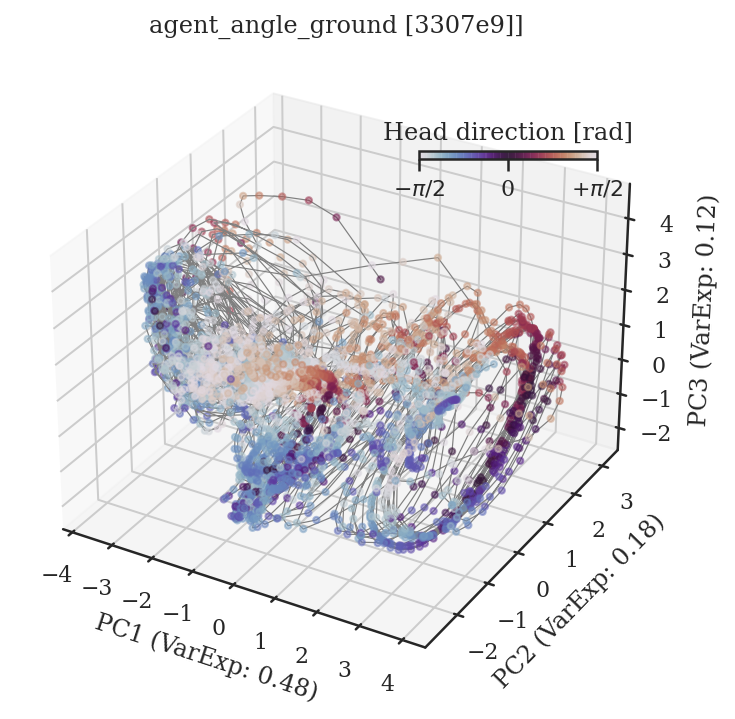

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_agent_angle_ground_3307e9.png


<Figure size 432x288 with 0 Axes>

In [18]:
# Plot neural-trajectories on common subspace
# %matplotlib notebook 
# importlib.reload(log_analysis)

# %config InlineBackend.figure_format = 'retina' # For manuscript
# mpl.rcParams['figure.dpi'] = 300

importlib.reload(agent_analysis)
importlib.reload(sim_analysis)
importlib.reload(log_analysis)
importlib.reload(config)


column_to_titlestring = {
    'odor_lastenc': 'Steps since last\nplume encounter',
    'stray_distance': 'stray_distance', 
    'odor_01': 'On/off plume',
    'odor_ma': 'Odor concentration MA [A.U.]',
    'odor_ewm': 'Odor concentration EWMA [A.U.]',
    'odor_enc': 'Odor encounters EWMA [A.U.]',
    'wind_theta_obs': 'Egocentric\nwind angle [rad]',
    'agent_angle_ground': r'Head direction [rad]',
    'turn': 'Turn',
    'step': 'Step',
    'neural_velocity': r"$\Delta$h",
}

column_ticklabels = {
    'agent_angle_ground': [r'$-\pi/2$', 0, r'$+\pi/2$'],
}

column_ticks = {
    'agent_angle_ground': [0, 0.5, 1.0],
}



from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def plot_common_subspace_all(selected_df, colorby):
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.gca(projection='3d')
    
    colorby_prefix = None
    if '_best' in colorby:
        colorby_prefix = colorby.replace('_best', '')
        window_length = best_window_lengths[colorby_prefix]
        colorby = f"{colorby_prefix}_{window_length}"
        print("best", colorby, colorby_prefix)

#     plot_df = selected_df.groupby(['dataset', 'outcome']).head(5)
    plot_df = selected_df.groupby(['dataset', 'outcome']).tail(5)
    # plot_df = selected_df.groupby(['dataset', 'outcome']).sample(5, replace=True)

    colorbar_is_plotted = False
    for idx, row in plot_df.iterrows():
        outcome = row['outcome']
        ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#         ep_activity =  pd.DataFrame(ep_activity).diff().fillna(0).to_numpy() # if colorby == 'neural_velocity' else ep_activity

        traj_df = log_analysis.get_traj_df(row['log'], 
                   extended_metadata=True, 
                   squash_action=True, 
                   n_history=100,
                   seed=model_seed)

        X_pca = pca_common.transform(ep_activity)
#         X_pca = pd.DataFrame(X_pca).diff().to_numpy()

        ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=1.0)

        if colorby == 'outcome':
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, 
                            c=outcome_colormap[outcome], label='outcome')
            continue
        elif colorby == 'regime':    
            regime_colors = [ regime_colormap[x] for x in traj_df['regime'] ]
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, 
                            c=regime_colors, 
#                             edgecolors=None,
                            alpha=0.85)
            continue
        elif colorby in ['wind_theta_obs', 'agent_angle_ground']:  
            # Cyclic colormap: https://matplotlib.org/stable/tutorials/colors/colormaps.html
            # Seaborn: https://stackoverflow.com/questions/23712207/cyclic-colormap-without-visual-distortions-for-use-in-phase-angle-plots
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='twilight', alpha=0.5, vmin=0, vmax=1)
            continue
        elif 'odor_lastenc' in colorby:    
            vmax = 35 # fixed for odor_lastenc
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif 'odor_ma_' in colorby:    
            vmax = None
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif 'odor' in colorby:    
            vmax = 1.0
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=vmax)
            continue
        elif colorby == 'stray_distance':    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=2)
            continue
        elif colorby in ['step', 'turn']:    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0, vmax=1)
            continue        
        elif colorby == 'neural_velocity':    
            c = pd.DataFrame(ep_activity).diff().fillna(0).apply(np.linalg.norm, axis=1)
#             c /= pd.DataFrame(ep_activity).apply(np.linalg.norm, axis=1)
#             c = np.log(1+c)
#             c = np.clip(0, 1.5, c)
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0)
            continue
        else:    
            c = traj_df[colorby]
            print(colorby, c.min(), c.max())
            sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
                            s=10, c=c, cmap='copper', alpha=0.5, vmin=0)

    if not batchmode:
        plt.title(f"{colorby} [{model_seed}]]")

    # https://stackoverflow.com/questions/18211967/position-colorbar-inside-figure
    if colorby not in ['outcome', 'regime']:
#         plt.colorbar(sc)
        cbar_ax = inset_axes(ax, 
                             width="30%", 
                             height="3%", 
#                              loc='upper right',
                             bbox_to_anchor=(0.0, 0.45, 0.92, 0.4), # (x0, y0, width, height)
                             bbox_transform=ax.transAxes,
                            )
        clb = plt.colorbar(sc, cbar_ax, orientation='horizontal') # ticks=[0., 1.]
#         cbar_ax.set_title(colorby)
        if colorby in column_to_titlestring.keys():
            cbar_ax.set_title(column_to_titlestring[colorby])
        if colorby in column_ticklabels.keys():
            clb.set_ticks(column_ticks[colorby])
            clb.set_ticklabels(column_ticklabels[colorby])

        print("Here1")
        if colorby_prefix in column_to_titlestring.keys():
            print("Here2")
            cbar_ax.set_title(column_to_titlestring[colorby_prefix])




    # https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
    # divider = make_axes_locatable(ax)
    # cax = divider.append_axes("right", size="5%", pad=0.05)
    # plt.colorbar(sc, cax=cax)

    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
#     plt.legend()
    plt.tight_layout()
    
    if colorby == 'regime':    
        handles, labels = plt.gca().get_legend_handles_labels()
        patch1 = mpatches.Patch(color=regime_colormap['TRACK'], label='Track')   
        patch2 = mpatches.Patch(color=regime_colormap['RECOVER'], label='Recover')   
        patch3 = mpatches.Patch(color=regime_colormap['SEARCH'], label='Lost')   
        handles.extend([patch1, patch2, patch3])
        plt.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.95, 0.9))

    plt.show()
    
    fname = f"{outdir}/comsub_{colorby}_{model_seed}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight', transparent=True)

    # Just plot colorbar
#     if colorby not in ['outcome', 'regime']:
#         fig = plt.figure()
#         ax = plt.gca()
#         sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], 
#                     s=10, c=c, cmap='copper', alpha=0.5, vmin=0)
#         plt.colorbar(sc, orientation='horizontal') # ticks=[0., 1.]

#         fname = f"{outdir}/comsub_{colorby}_{model_seed}_colorbar.png"
#         print("Saving:", fname)
#         plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')


    

if batchmode:
    colorbys = [
            'outcome', 
           'regime', 
           'odor_lastenc',
           'stray_distance', 
           'odor_01', 
           'odor_ma_best',
           'odor_ewm_best',
           'odor_enc_best',
#            'odor_ma_8',
           'wind_theta_obs',
           'agent_angle_ground',
           'turn',
           'step',
           'neural_velocity']
else:
    colorbys = [
#         'outcome', 
       'regime', 
#        'odor_lastenc',
#        'stray_distance', 
#        'odor_01', 
#        'odor_ma_10',
#        'odor_ewm_10',
#        'odor_enc_50',
         'odor_ma_best',
         'odor_ewm_best',
         'odor_enc_best',
#        'wind_theta_obs',
       'agent_angle_ground',
#        'turn',
#        'step',
#        'neural_velocity'
    ]
    
for colorby in colorbys:
    plot_common_subspace_all(selected_df, colorby)



seed specific thresholds 12 35
Coloring 2 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


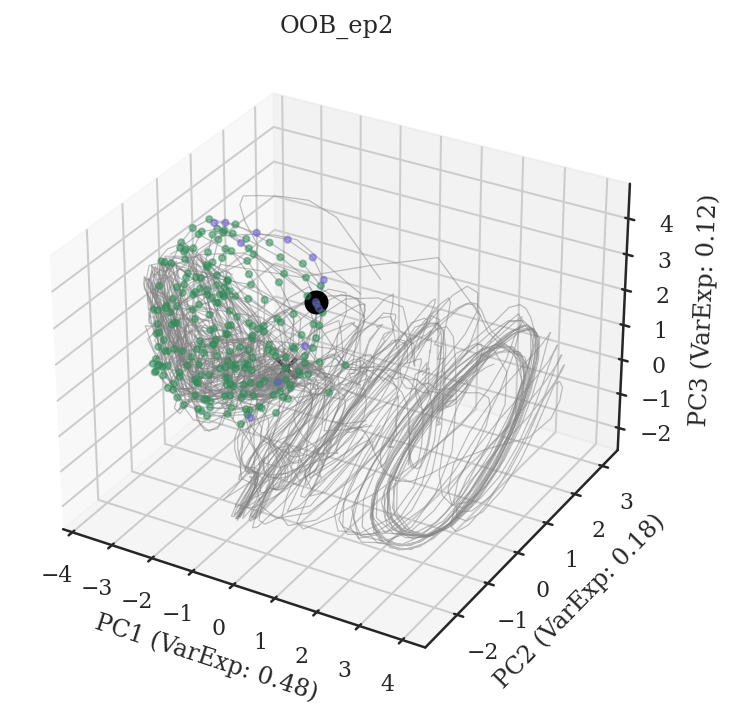

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep2.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

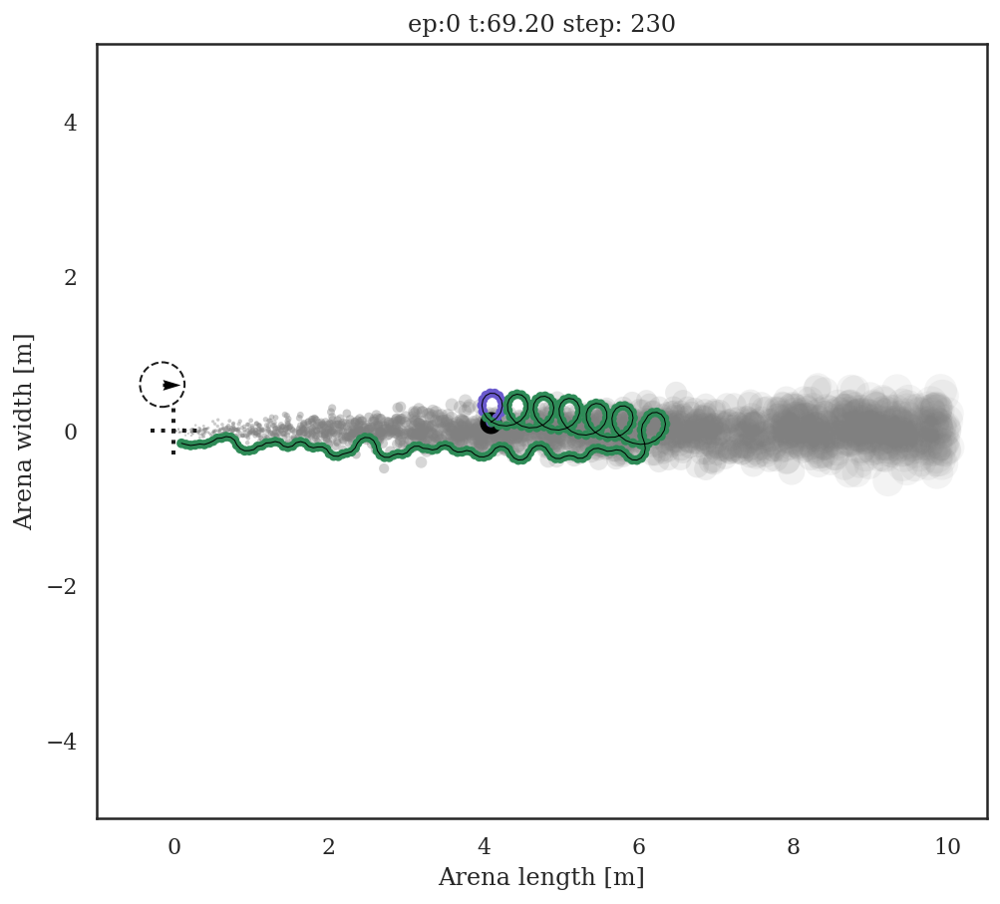

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep2.png
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 81 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thre

<Figure size 432x288 with 0 Axes>

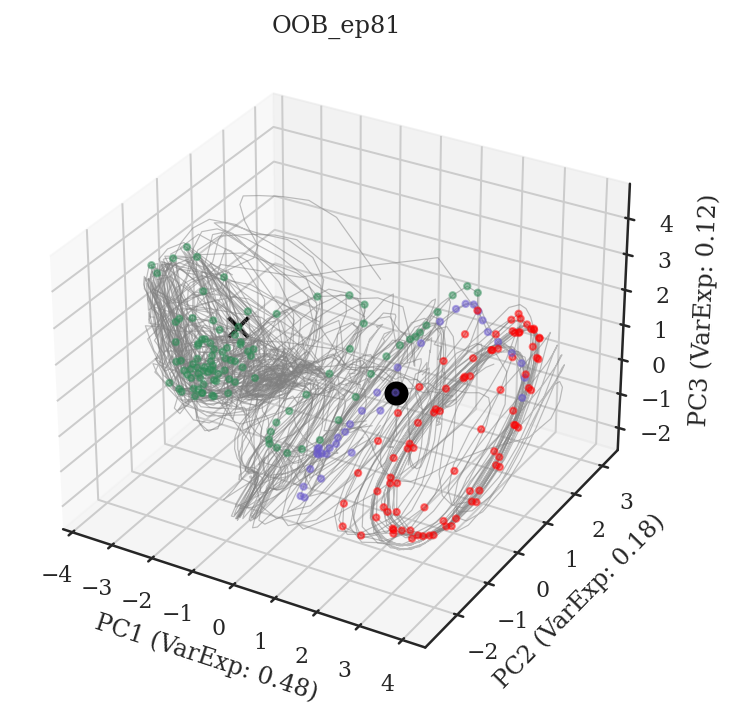

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep81.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

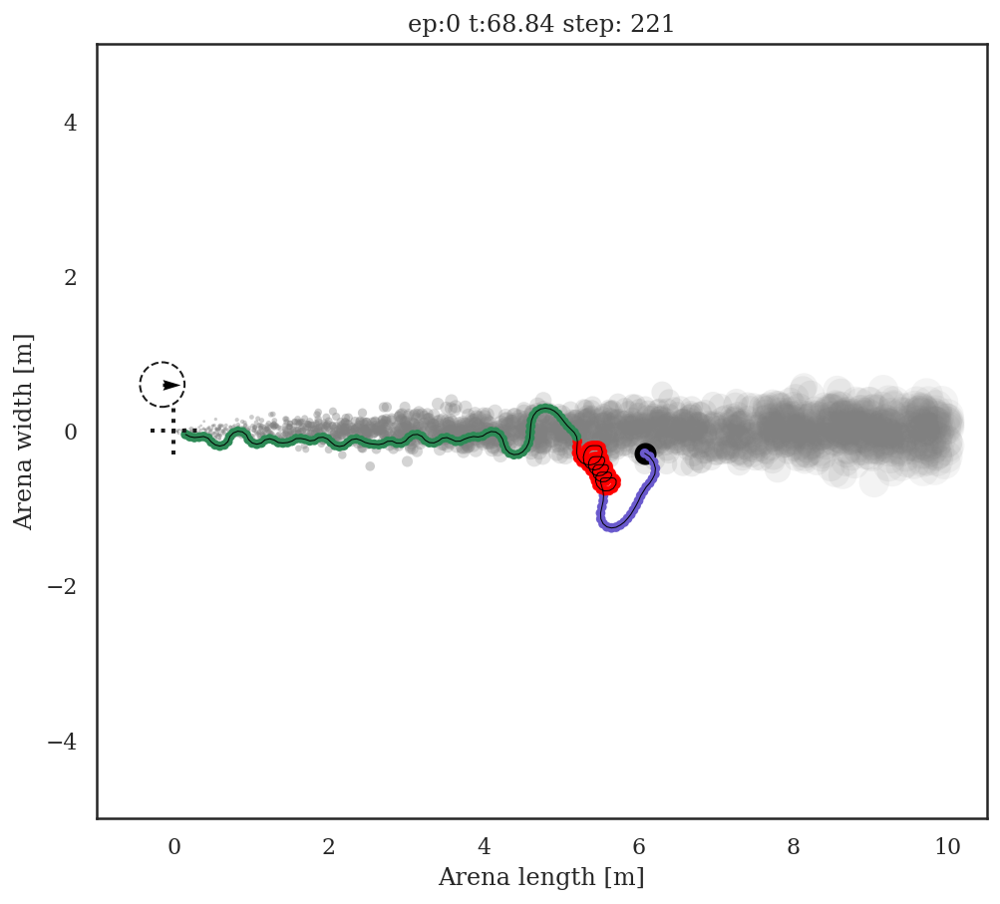

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep81.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 65 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thr

<Figure size 432x288 with 0 Axes>

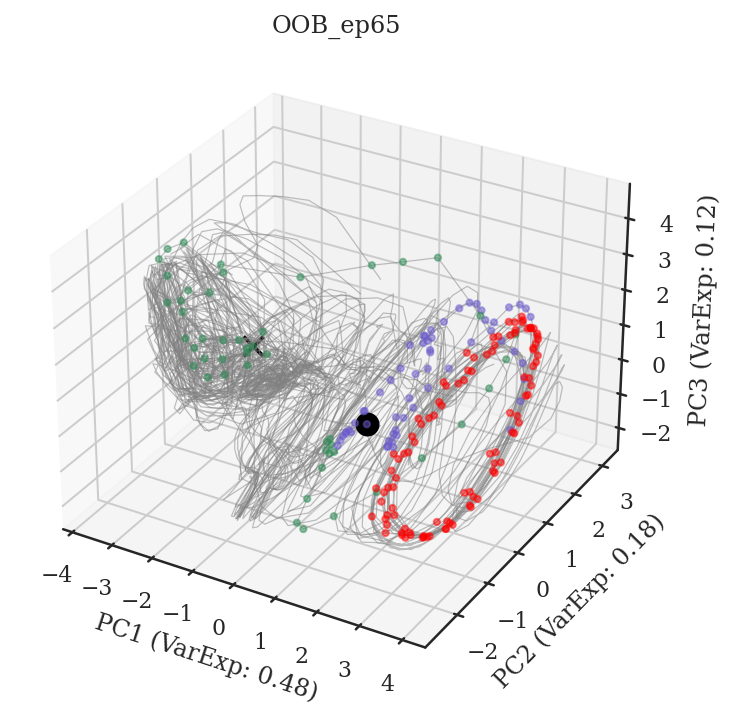

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep65.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

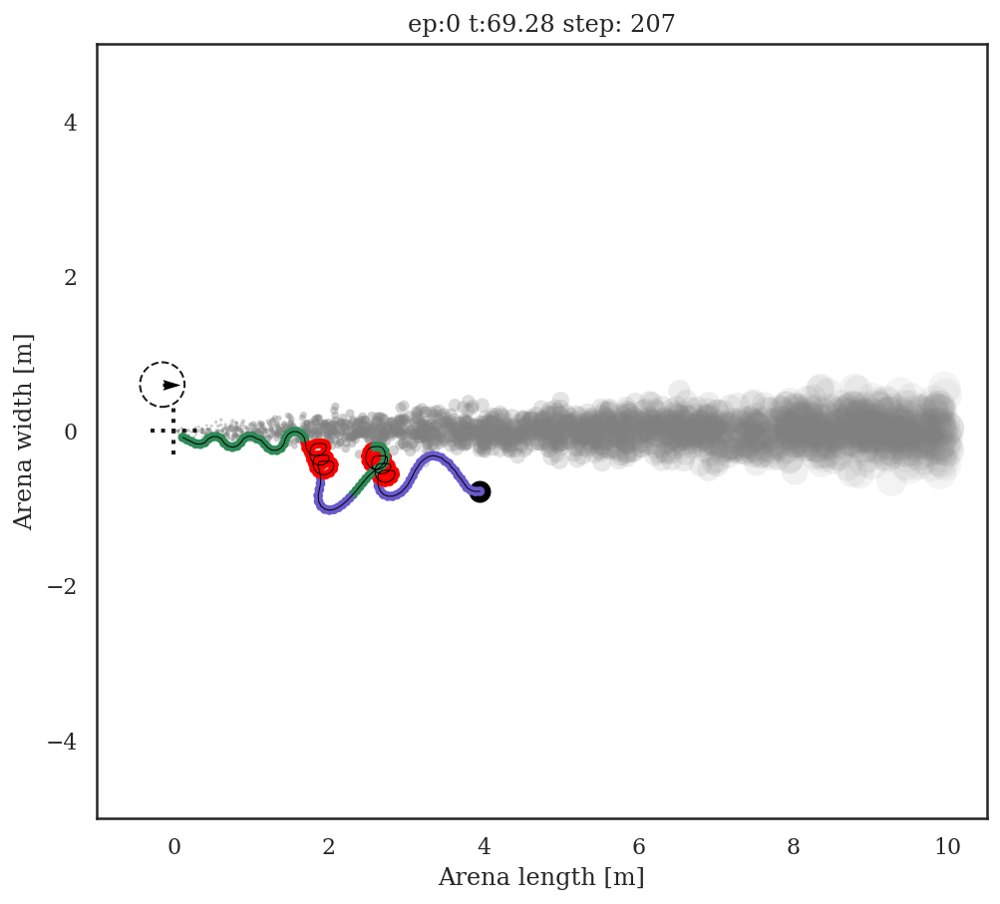

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep65.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 93 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thr

<Figure size 432x288 with 0 Axes>

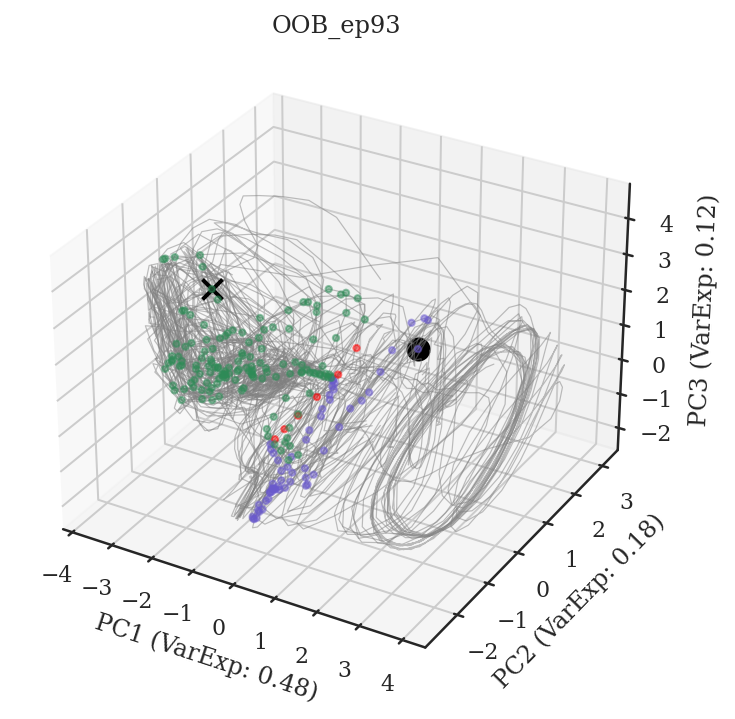

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep93.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

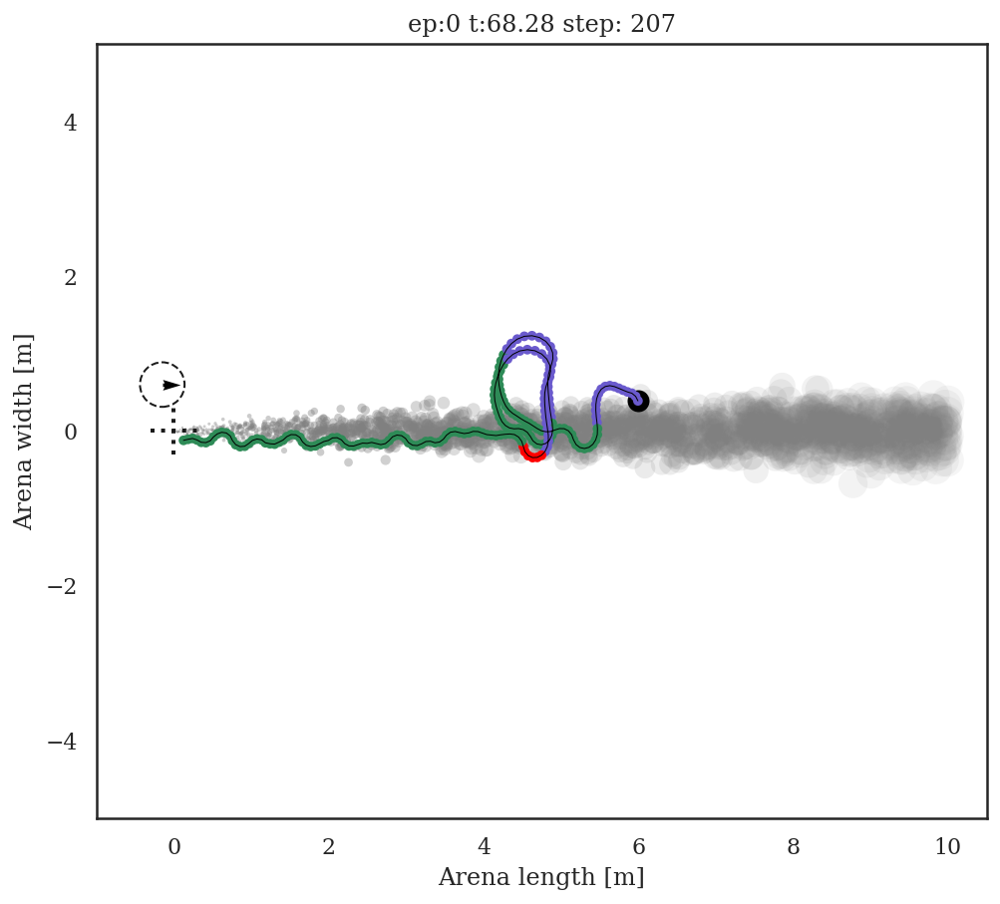

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep93.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 108 HOME
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific th

<Figure size 432x288 with 0 Axes>

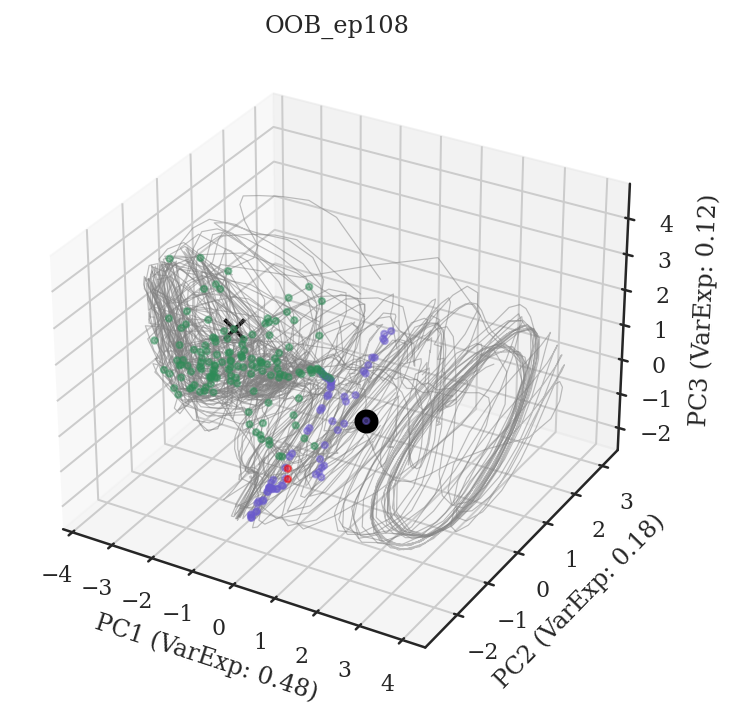

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep108.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

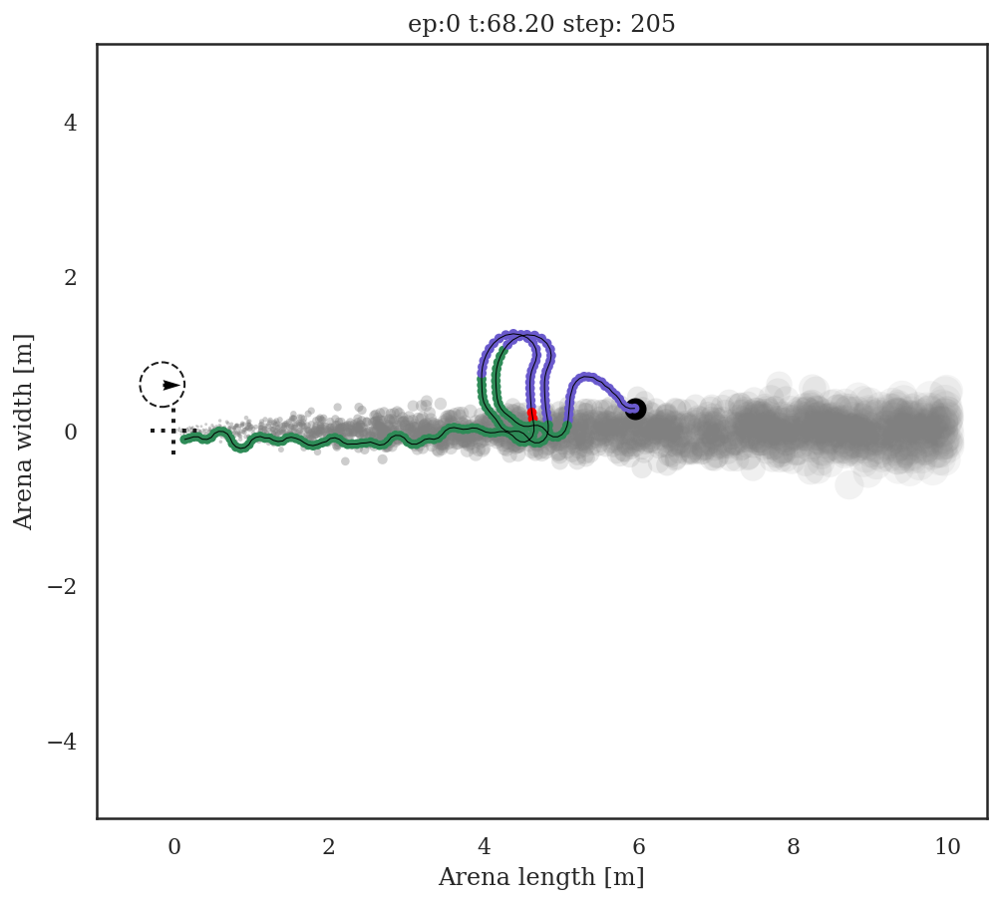

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep108.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 1 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thre

<Figure size 432x288 with 0 Axes>

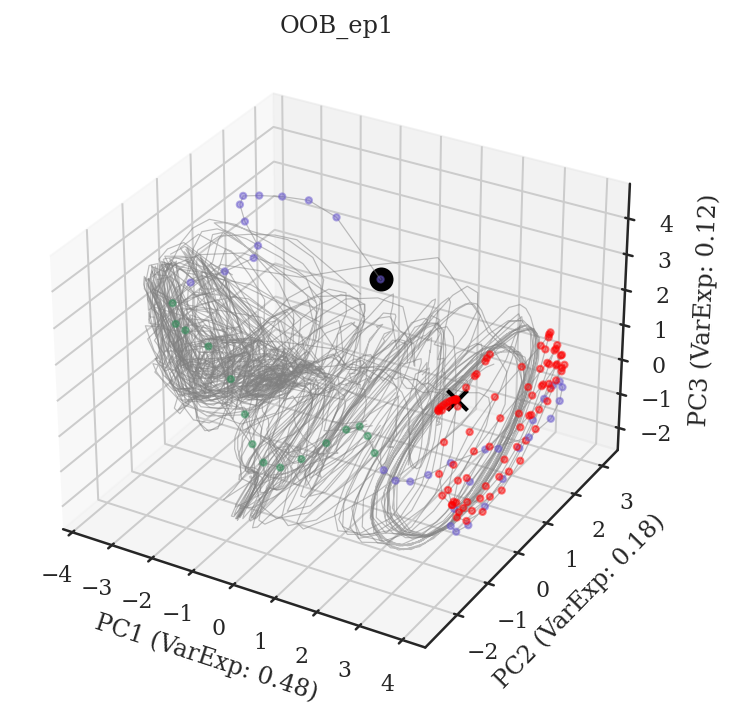

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep1.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

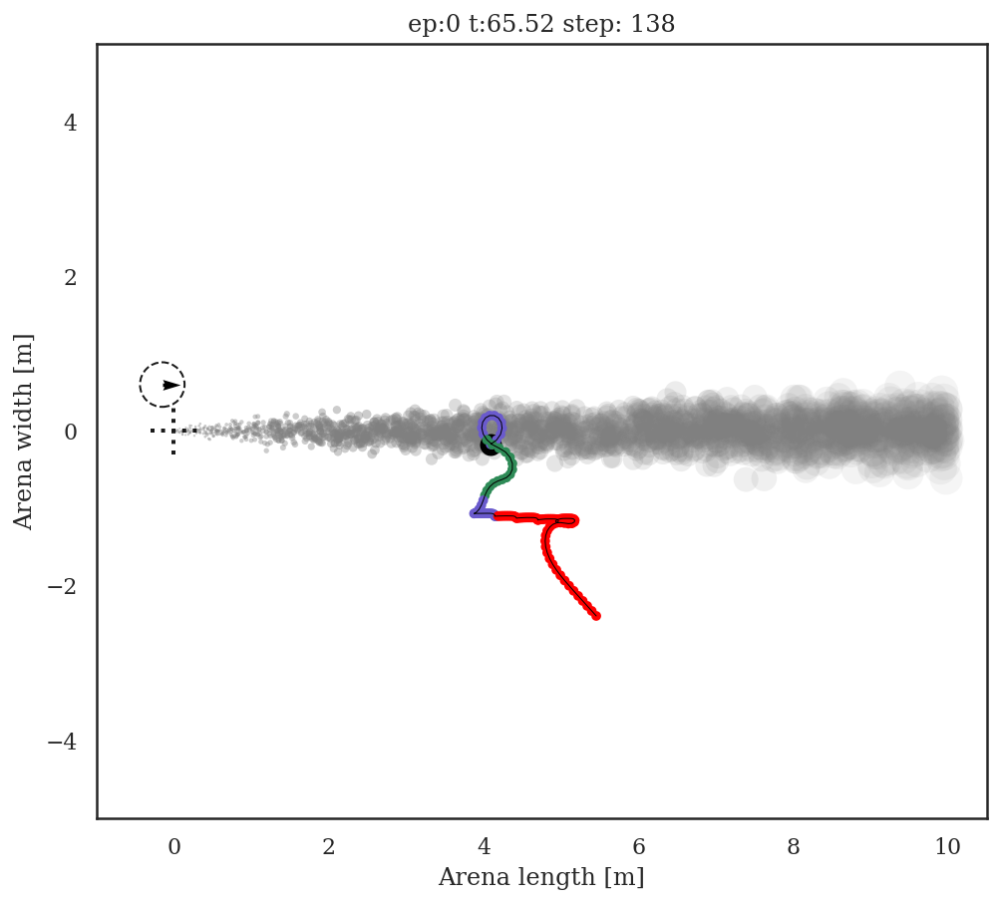

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep1.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 33 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thres

<Figure size 432x288 with 0 Axes>

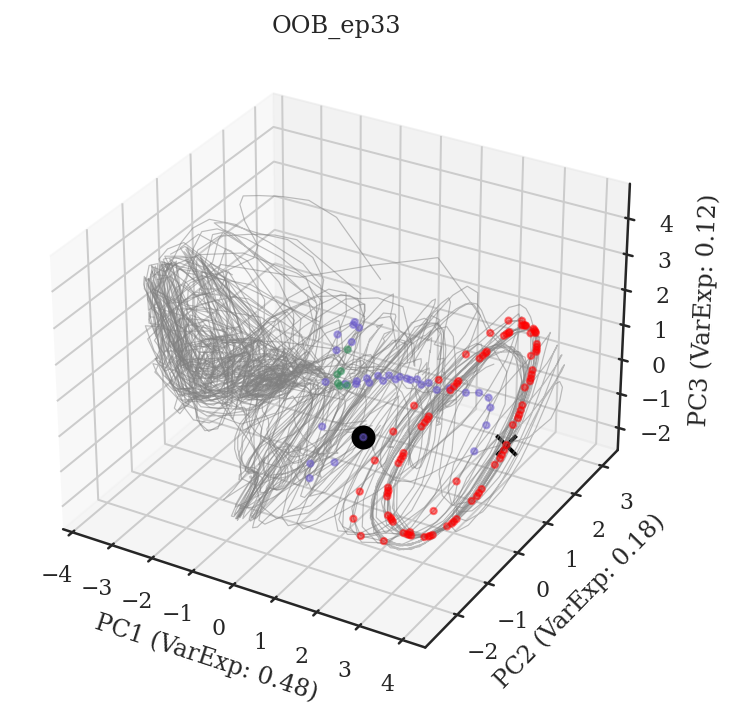

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep33.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

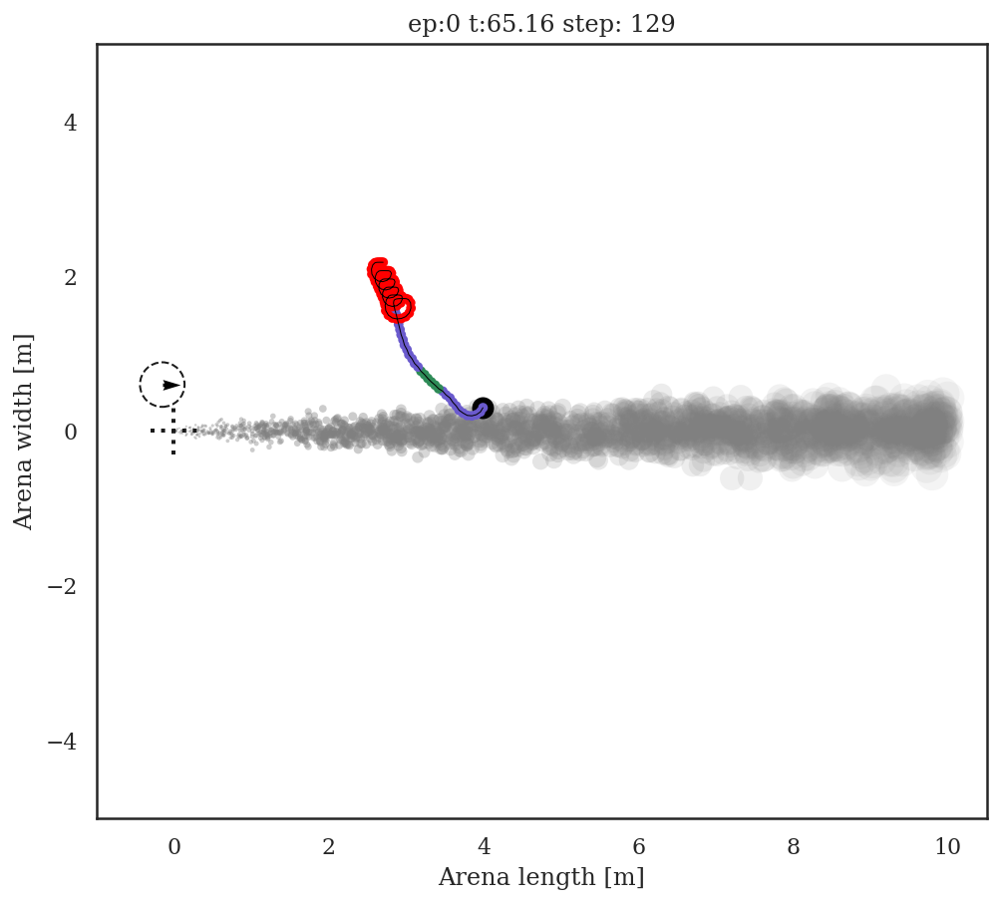

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep33.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 199 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thr

<Figure size 432x288 with 0 Axes>

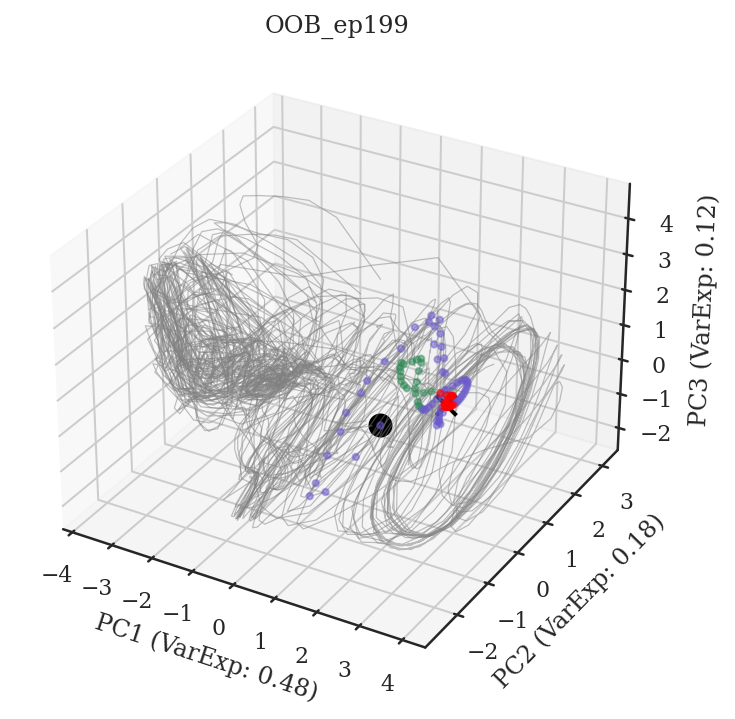

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep199.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

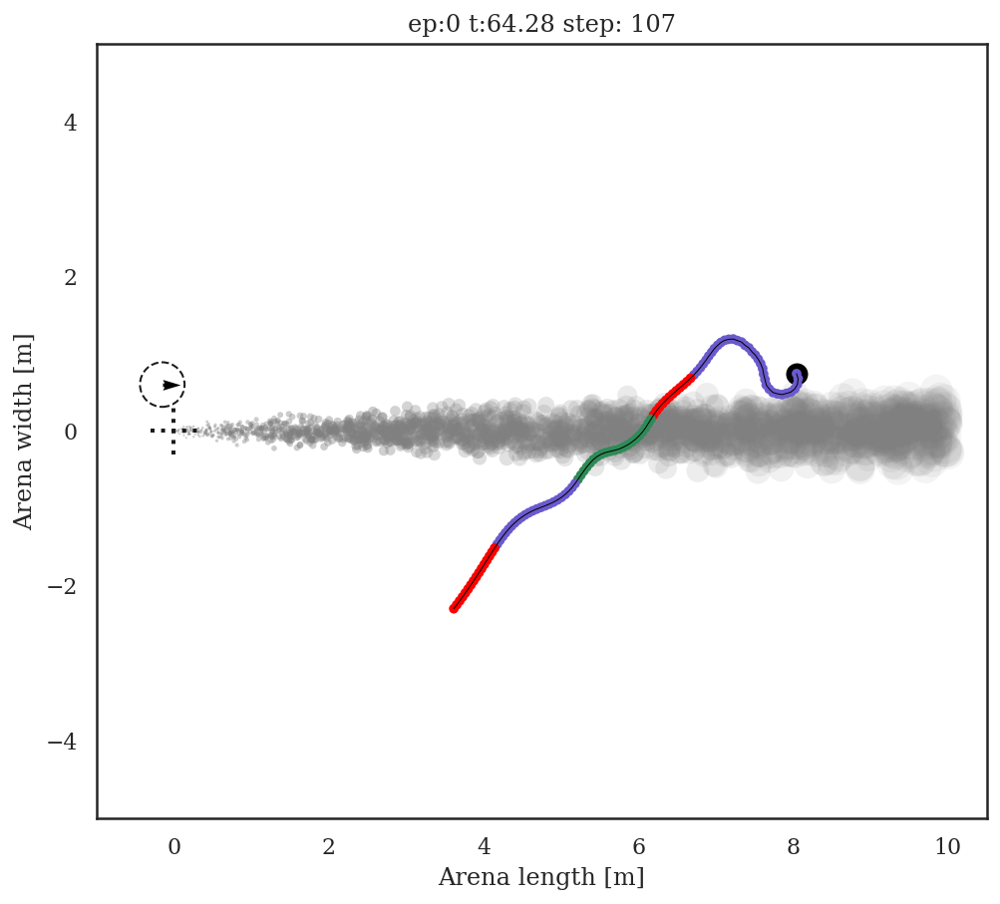

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep199.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 5 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thre

<Figure size 432x288 with 0 Axes>

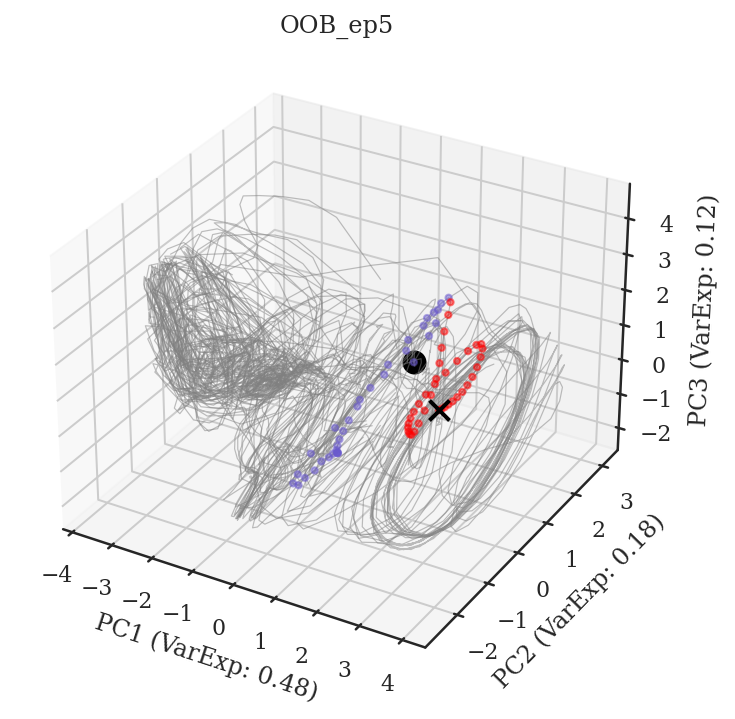

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep5.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

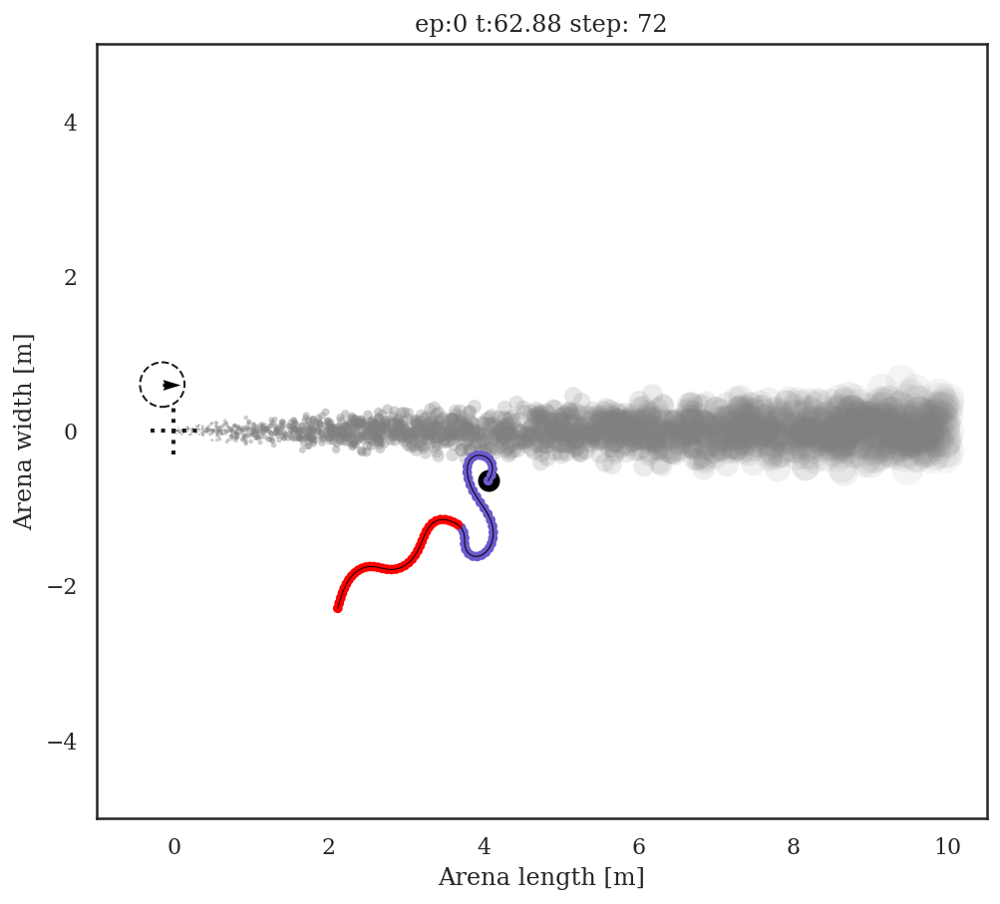

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep5.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
Coloring 0 OOB
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresh

<Figure size 432x288 with 0 Axes>

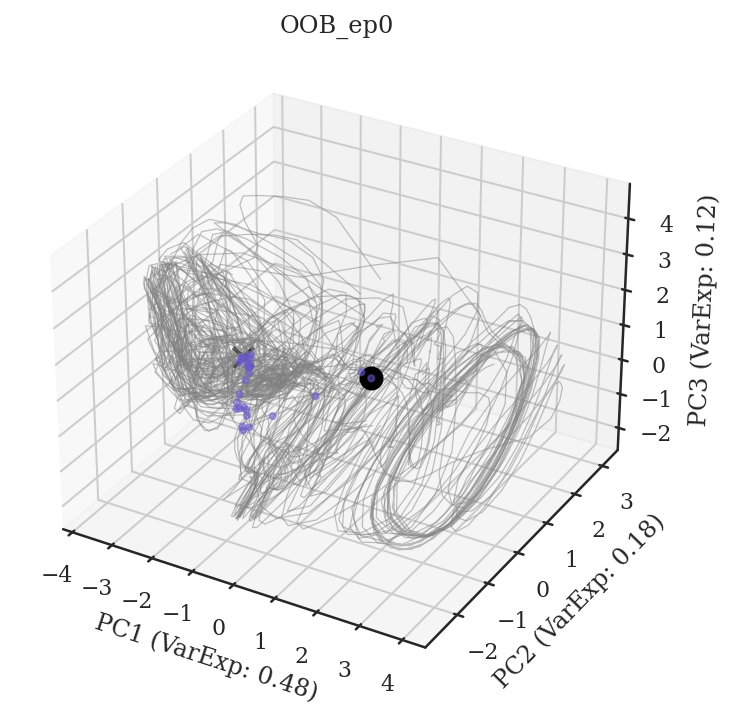

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_3307e9_OOB_ep0.png
seed specific thresholds 12 35
constantx5b5


<Figure size 432x288 with 0 Axes>

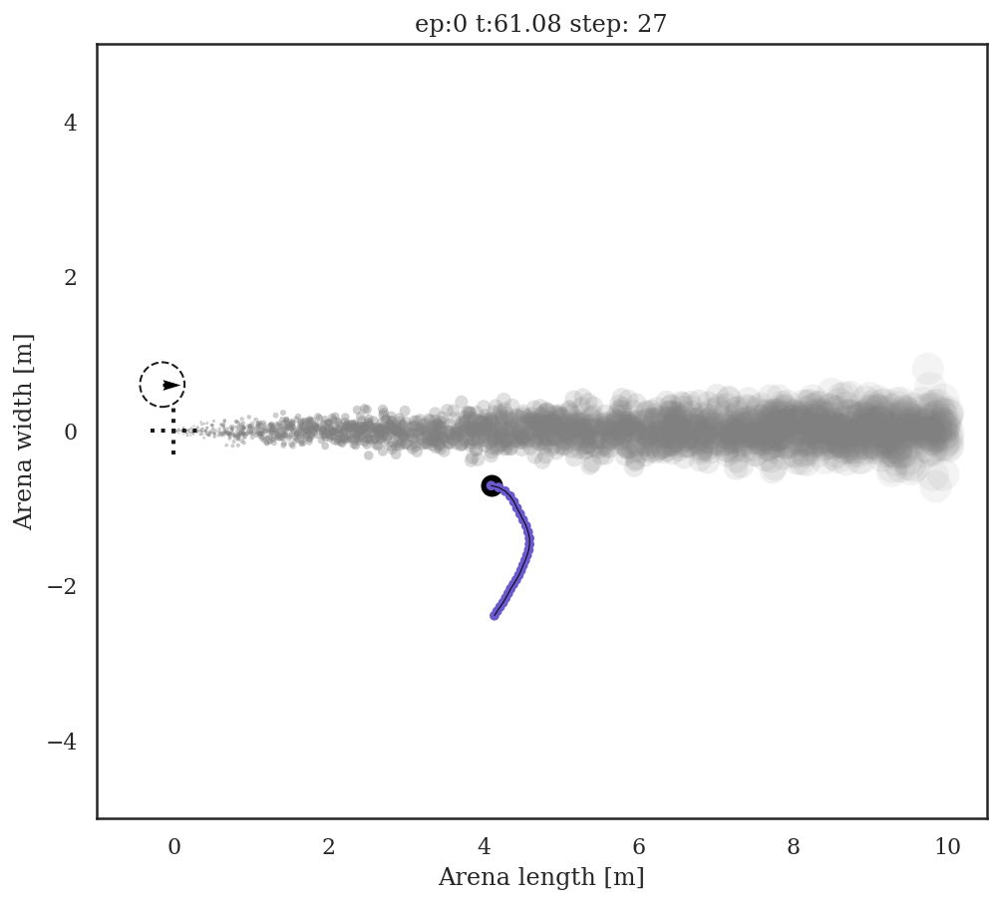

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//traj_regime_3307e9_OOB_ep0.png


<Figure size 432x288 with 0 Axes>

In [19]:
# Plot neural-trajectories on common subspace
# %matplotlib notebook 
# importlib.reload(log_analysis)

def plot_common_subspace_individual(selected_df, plot_df, idxs_to_color):
    for outcome in ['HOME', 'OOB']:        
        for idx2color in idxs_to_color[outcome]:
            fig = plt.figure(figsize=pca3d_figsize)
            ax = fig.gca(projection='3d')

            for idx, row in plot_df.iterrows():
                outcome = row['outcome']
                ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
                traj_df = log_analysis.get_traj_df(row['log'], 
                        extended_metadata=False, 
                        squash_action=False,
                        seed=model_seed)

                X_pca = pca_common.transform(ep_activity)
                ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=0.5)

                # Color trajectory timestep by REGIME
                if row['dataset'] == viz_dataset and row['idx'] == idx2color:
                    viz_log = row['log']
                    print('Coloring', row['idx'], outcome)
                    regime_colors = [ regime_colormap[x] for x in traj_df['regime'] ]
                    sc = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], s=10, c=regime_colors, alpha=0.5)
                    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], c='black', marker='o', lw=2, s=100) # Start
                    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], X_pca[-1, 2], c='black', marker='x', lw=2, s=100) # End

            #     print(idx, row['idx'])
            ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
            ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
            ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
            plt.title(f"{outcome}_ep{idx2color}")
            plt.tight_layout()
            plt.show()
            fname = f"{outdir}/comsub_{model_seed}_{outcome}_ep{idx2color}.png"
            print("Saving:", fname)
            plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
                        
            # Plot associated trajectory
            traj_df = log_analysis.get_traj_df(viz_log, 
                    extended_metadata=False, 
                    squash_action=True,
                    seed=model_seed)
            regime_colorby = log_analysis.regime_to_colors( traj_df['regime'].to_list() )
            agent_analysis.visualize_episodes([viz_log], 
                                          zoom=2, 
                                          dataset=viz_dataset,
                                          animate=False,
                                          colorby=regime_colorby
                                         )
            plt.xlim(-1, 10.5)
            plt.show()
            title = f"{outcome}_ep{idx2color}"
            fname = f"{outdir}/traj_regime_{model_seed}_{title}.png"
            print("Saving:", fname)
            plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

            
viz_dataset = 'constantx5b5'
# viz_dataset = 'switch45x5b5'
# viz_dataset = 'noisy6x5b5'
# viz_dataset = 'noisy3x5b5'

n_background = 5
n_color = 5
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)
idxs_to_color = {}
for outcome in plot_df['outcome'].unique():
    idxs_to_color[outcome] = plot_df.query("dataset == @viz_dataset and outcome == @outcome").head(n_color)['idx'].to_list()

plot_common_subspace_individual(selected_df, plot_df, idxs_to_color)

In [20]:
# # importlib.reload(agent_analysis)
# # importlib.reload(log_analysis)

# def plot_common_subspace_individual_traj(plot_df, idxs_to_color):
#     for outcome in ['HOME', 'OOB']:
#         for idx, row in plot_df.iterrows():
#             if row['dataset'] == viz_dataset and row['idx'] in idxs_to_color[outcome]:
#                 outcome = row['outcome']
#                 ep_activity = log_analysis.get_activity(row['log'], 
#                                                         is_recurrent, 
#                                                         do_plot=False)
#                 traj_df = log_analysis.get_traj_df(row['log'], 
#                     extended_metadata=False, squash_action=False, seed=model_seed)

#                 print('Coloring', row['idx'], outcome, row['dataset'])
                
#                 title = f"{outcome}_ep{row['idx']}"
#                 agent_analysis.visualize_episodes([row['log']], 
#                                           zoom=2, 
#                                           dataset=row['dataset'],
#                                           animate=False,
# #                                           title=title, # not supported
#                                           colorby='regime'
#                                          )
#                 plt.xlim(-1, 10.5)
#                 plt.show()
#                 fname = f"{outdir}/traj_regime_{title}.png"
#                 print("Saving:", fname)
#                 plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

# plot_common_subspace_individual_traj(plot_df, idxs_to_color)

## Time to surge/time to cast analysis

### Extract centroids of [HOME] and [OOB] from actual trials

In [21]:
trail_len = 25
h_outcomes = ['HOME', 'OOB']
hx_centroids = {}
for h_outcome in h_outcomes: 
    hx_trailing = [] # hidden activity around end of trial
    #     for log in plot_df.query("outcome == @h_outcome")['log']:
    for log in selected_df.query("outcome == @h_outcome")['log']:
        ep_activity = log_analysis.get_activity(log, 
                                            is_recurrent, 
                                            do_plot=False)
#         print(h_outcome, ep_activity.shape[0])
        if h_outcome == 'HOME':
            hx_trailing.append( ep_activity[-trail_len:,:] )
        if h_outcome == 'OOB' and ep_activity.shape[0] > 75: # Use longer (>3s) traj for OOB
            hx_trailing.append( ep_activity[-trail_len:,:] )
    hx_trailing = np.vstack(hx_trailing)
    # hx_trailing.shape
#     hx_centroids[h_outcome] = np.median(hx_trailing, axis=0).reshape((1, -1))
    hx_centroids[h_outcome] = np.mean(hx_trailing, axis=0).reshape((1, -1))
    
dist_between_centroids = np.linalg.norm(hx_centroids[h_outcomes[0]] - hx_centroids[h_outcomes[1]])
dist_between_centroids

5.702561

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


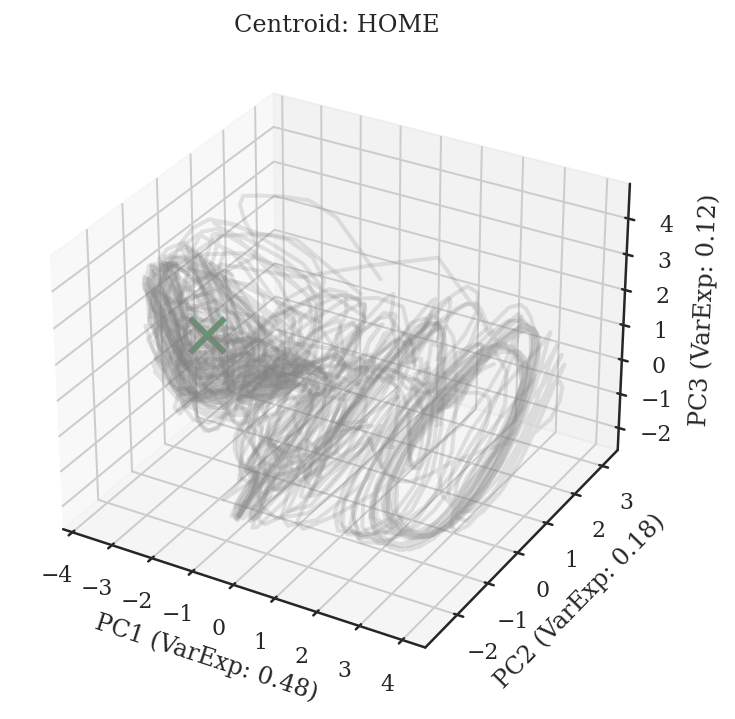

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//centroids_3307e9_HOME.png
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spec

<Figure size 432x288 with 0 Axes>

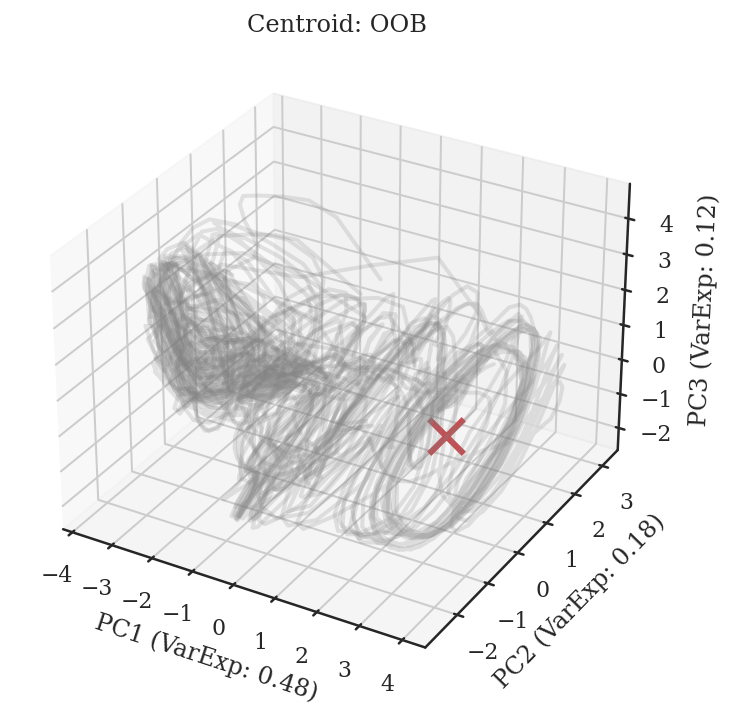

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//centroids_3307e9_OOB.png


<Figure size 432x288 with 0 Axes>

In [22]:
# Plot extracted centroids
n_background = 5
n_color = 1
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

for h_outcome in h_outcomes: 
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.gca(projection='3d')

    for idx, row in plot_df.iterrows():
        outcome = row['outcome']
        ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
        traj_df = log_analysis.get_traj_df(row['log'], 
                extended_metadata=False, squash_action=False, seed=model_seed)

        X_pca = pca_common.transform(ep_activity)
        ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=2, c='grey', alpha=0.2)

    # plot the centroid
    X_pca = pca_common.transform(hx_centroids[h_outcome])
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], 
       c=outcome_colormap[h_outcome], marker='x', linewidth=3.0, s=300, alpha=1.0) 
    
    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
    plt.title(f"Centroid: {h_outcome}")
    plt.tight_layout()
    plt.show()

    fname = f"{outdir}/centroids_{model_seed}_{h_outcome}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

In [23]:
outcome_colormap.values()

dict_values(['g', 'r', 'b'])

### Color by which centroid closer to [2-centroid model]

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


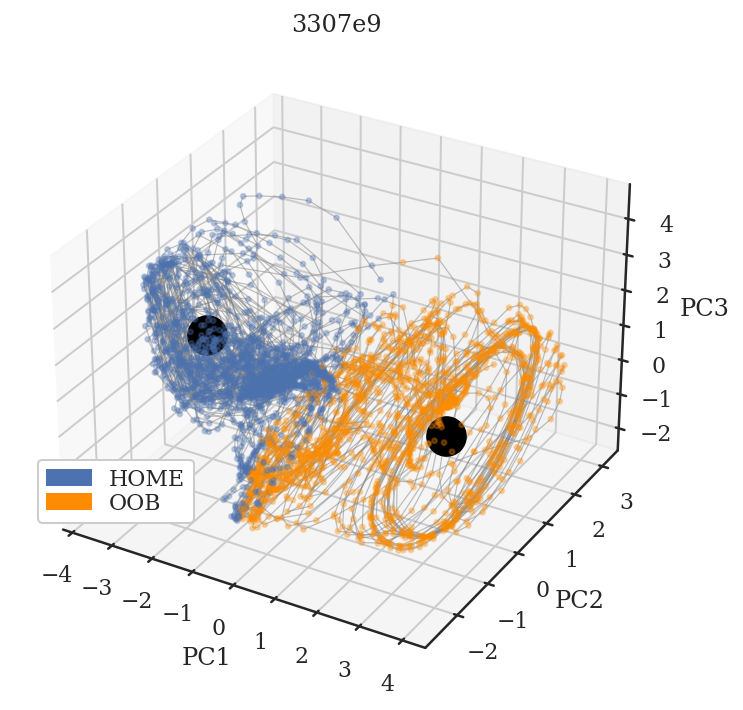

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//comsub_by_centroid_3307e9.png


<Figure size 432x288 with 0 Axes>

In [24]:
# %config InlineBackend.figure_format = 'retina'
# mpl.rcParams['figure.dpi'] = 300


n_background = 5
n_color = 1
plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

fig = plt.figure(figsize=pca3d_figsize)
# fig = plt.figure(figsize=(4,7))
ax = fig.gca(projection='3d')

# outcome_colormap['HOME'] = 'lightblue'
# outcome_colormap['HOME'] = 'b'
importlib.reload(config)
ttcs_colormap = config.ttcs_colormap

# Doesn't respect this!
# https://matplotlib.org/3.3.3/gallery/misc/zorder_demo.html
    
# # plot centroids
# for h_outcome in hx_centroids.keys():
#     X_pca = pca_common.transform(hx_centroids[h_outcome])
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
#        c='black', marker='x', lw=3, s=300, zorder=10) 

    
for idx, row in plot_df.iterrows():
    outcome = row['outcome']
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=False, squash_action=False, seed=model_seed)

    X_pca = pca_common.transform(ep_activity)
    ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
            linewidth=0.6, c='grey', alpha=0.5, zorder=1)

    # Add scatterplot colored by distance to centroids
    colors = pd.Series(['grey']*X_pca.shape[0])
    dist_home = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
    dist_oob = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
#     colors = pd.Series(outcome_colormap.values())[ dist_home < dist_oob ]
    closer_to_home = [ dist_home[i] < dist_oob[i] for i in range(dist_home.shape[0]) ] 
    colors = [ ttcs_colormap['HOME'] if x else ttcs_colormap['OOB'] for x in closer_to_home ]
#     for h_outcome in hx_centroids.keys():
#         distances = np.linalg.norm(ep_activity - hx_centroids[h_outcome], axis=1)
#         in_range_idxs = distances <= centroid_ranges[h_outcome]
#         colors[ in_range_idxs ] = outcome_colormap[h_outcome]
    ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
               c=colors, alpha=0.3, s=6, zorder=1)

# plot centroids
for h_outcome in hx_centroids.keys():
    X_pca = pca_common.transform(hx_centroids[h_outcome])
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
       c='black', marker='o', lw=3, s=300, zorder=10) 

# legend
handles, labels = plt.gca().get_legend_handles_labels()
patch1 = mpatches.Patch(color=ttcs_colormap['HOME'], label='HOME')   
patch2 = mpatches.Patch(color=ttcs_colormap['OOB'], label='OOB')   
handles.extend([patch1, patch2])
plt.legend(handles=handles, 
           loc='lower left', 
           framealpha=1.0,
           labelspacing=0.07,
           bbox_to_anchor=(0.02, 0.24),
          )

ax.set_xlabel(f'PC1')
ax.set_ylabel(f'PC2')
ax.set_zlabel(f'PC3')

# ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
# ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
# ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
if not batchmode:
    plt.title(f"{model_seed}")
plt.tight_layout()
plt.show()

fname = f"{outdir}/comsub_by_centroid_{model_seed}.png"
print("Saving:", fname)
plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')

In [25]:
# # Color if within range from centroid
# n_background = 5
# n_color = 1
# plot_df = selected_df.groupby(['dataset', 'outcome']).tail(n_background)

# # centroid_ranges = {'HOME':4.0, 'OOB':4.0}
# centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}

# fig = plt.figure(figsize=pca3d_figsize)
# ax = fig.gca(projection='3d')

# for h_outcome in hx_centroids.keys():
#     # plot the centroid
#     X_pca = pca_common.transform(hx_centroids[h_outcome])
#     ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], alpha=1.0, 
#        c=outcome_colormap[h_outcome], marker='x', s=100) 

# for idx, row in plot_df.iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)

#     X_pca = pca_common.transform(ep_activity)
#     ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=0.6, c='grey', alpha=0.5)

#     # Add scatterplot colored by distance to centroids
#     colors = pd.Series(['grey']*X_pca.shape[0])
#     for h_outcome in hx_centroids.keys():
#         distances = np.linalg.norm(ep_activity - hx_centroids[h_outcome], axis=1)
#         in_range_idxs = distances <= centroid_ranges[h_outcome]
#         colors[ in_range_idxs ] = outcome_colormap[h_outcome]
#     ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], 
#                c=colors, alpha=0.3, s=4)



# ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
# ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
# ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')
# plt.title(f"Centroid: {h_outcome}")
# plt.tight_layout()
# plt.show()

# fname = f"{outdir}/centroids_by_dist_{model_seed}_{h_outcome}.png"
# print("Saving:", fname)
# plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')


## Floris Q: Time to cast vs time to surge

### Time to cast

In [26]:
# Find episodes that end in casting (OOB)
# Find time from last_enc=0 to entry into OOB-centroid-range
# However, should have encountered plume at least once i.e. last_enc=0 for multiple rows

# for idx, row in plot_df.query("outcome == 'OOB' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)
#     if sum(traj_df.odor_lastenc == 0) > 1: # encountered plume at least once
#         print("Found")
#         break

In [27]:
# # centroid_ranges = {'HOME':dist_between_centroids/3, 'OOB':dist_between_centroids/3}
# centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}


# home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
# oob_distances

# # TODO fix -- Hack to get plot scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# max_val
# # np.max(home_distances)

# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)
# # 
# # pd.Series(home_distances).describe(), pd.Series(oob_distances).describe()

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

# exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()
# print(exit_idx)

# pd.Series(home_distances).plot(figsize=(5, 1.5), label=r'd$_{HOME}$') # Blue
# pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# agent_analysis.visualize_episodes([row['log']], 
#           zoom=2, 
#           dataset=row['dataset'],
#           animate=False,
#          )
# plt.show()

# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

# agent_analysis.visualize_episodes([row['log']], 
#     zoom=2, 
#     dataset=row['dataset'],
#     animate=False,
#     )
# plt.show()

In [28]:
# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()
# print(exit_idx)
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.show()

In [29]:
# # Distances in PCA space? -- Basically the same

# ep_pca = pca_common.transform(ep_activity)
# hx_centroids_pca = {}
# for h_outcome in hx_centroids.keys():
#     hx_centroids_pca[h_outcome] = pca_common.transform(hx_centroids[h_outcome])

# home_distances = np.linalg.norm(ep_pca - hx_centroids_pca['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_pca - hx_centroids_pca['OOB'], axis=1)

# # TODO fix -- Hack to get scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

# pd.Series(home_distances).plot(figsize=(5, 1.5))
# pd.Series(oob_distances).plot() # Orange

In [30]:
# # traj_df.loc[:, ['loc_x', 'loc_y']]
# # plt.plot(traj_df['loc_x'], traj_df['loc_y'])
# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=home_distances,
#                           vmax=max_val,
#                          )

# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=oob_distances,
#                           vmax=max_val,
#                          )

### Time to surge

In [31]:
# # Find episodes that end in HOME
# # Do a hist. of last_enc_max
# # If bimodal, choose episodes with longer duration mode; 
# #   else arbitrary threshold
# # Find trajectory snippets from last_enc.diff()<0, to 15(?) timesteps...
# # .... and look for entry into the HOME-centroid-range

# last_encs = []
# # for idx, row in selected_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
# for idx, row in plot_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)
# #     last_encs.extend( traj_df.odor_lastenc.to_list() )
#     last_encs.append( traj_df.odor_lastenc.max() )
# pd.Series(last_encs).hist() # Not bimodal for plot_df, but is for selected_df

In [32]:
# last_encs = []
# # for idx, row in selected_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
# for idx, row in plot_df.query("outcome == 'HOME' and dataset == 'constantx5b5' ").iterrows():
#     outcome = row['outcome']
#     ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
#     traj_df = log_analysis.get_traj_df(row['log'], 
#             extended_metadata=False, squash_action=False, seed=model_seed)

#     if sum(traj_df.odor_lastenc >= 25) >= 1:
#         print("Found", idx)
#         break
        
# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)); plt.show()
# pd.Series(traj_df.odor_01).plot(figsize=(5, 1)); plt.show()

In [33]:
# home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
# oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)
# oob_distances

# # TODO fix -- Hack to get scales same
# max_val = np.max( [np.max(home_distances), np.max(oob_distances)] )
# min_val = np.min( [np.min(home_distances), np.min(oob_distances)] )
# print(min_val, max_val)

# pd.Series(home_distances).hist(alpha=0.5) # Blue
# pd.Series(oob_distances).hist(alpha=0.5) # Orange
# plt.show()

In [34]:
# entry_idx = traj_df.odor_lastenc.argmax()
# print("entry_idx", entry_idx)


# pd.Series(home_distances).plot(figsize=(5, 1.5), label='d[HOME]') # Blue
# pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# # pd.Series(home_distances).plot(figsize=(5, 1.5))
# # pd.Series(oob_distances).plot() # Orange
# # for x in ['HOME', 'OOB']:
# #     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# # plt.axvline(x=entry_idx, c='grey', ls=':')
# # plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)) 
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()) # Orange
# for x in ['HOME', 'OOB']:
#     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# plt.axvline(x=exit_idx, c='grey', ls=':')
# plt.legend()
# plt.show()

# # pd.Series(home_distances).plot(figsize=(5, 1.5))
# # pd.Series(oob_distances).plot() # Orange
# # for x in ['HOME', 'OOB']:
# #     plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
# # plt.axvline(x=entry_idx, c='grey', ls=':')
# # plt.show()

# pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1)) 
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

# pd.Series(traj_df.odor_01).plot(figsize=(5, 1))
# plt.axvline(x=entry_idx, c='grey', ls=':')
# plt.show()

In [35]:
# # home_distances[entry_idx-3:entry_idx+4]
# pd.Series(home_distances).diff().plot(figsize=(5, 1.5))
# pd.Series(oob_distances).diff().plot() # Orange

In [36]:
# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=home_distances,
#                           vmax=max_val,
#                          )

# agent_analysis.visualize_episodes([row['log']], 
#                           zoom=2, 
#                           dataset=row['dataset'],
#                           animate=False,
#                           colorby=oob_distances,
#                           vmax=max_val,
#                          )

### Scale out TTC and TTS

In [37]:
# Work with all episodes
use_datasets_all = ['constantx5b5', 'constantx5b5_0.4', 'switch45x5b5', 'noisy3x5b5']
all_df = log_analysis.get_selected_df(model_dir, 
                              use_datasets_all, 
                              n_episodes_home=240, 
                              n_episodes_other=240,
                              balanced=False,
                              min_ep_steps=0)

In [38]:
all_df

,dataset,idx,ep_length,log,outcome
0,constantx5b5_0.4,157,299,"{'trajectory': [[6.045080648168933, -0.0224507...",HOME
1,constantx5b5_0.4,90,297,"{'trajectory': [[6.001161993827821, -0.7616670...",HOME
2,constantx5b5_0.4,205,295,"{'trajectory': [[8.064312548072689, -0.8738030...",HOME
3,constantx5b5_0.4,120,289,"{'trajectory': [[6.072392199725216, -0.8889635...",HOME
4,switch45x5b5,212,288,"{'trajectory': [[8.005338071452826, 0.03315190...",HOME
...,...,...,...,...,...
626,noisy3x5b5,40,31,"{'trajectory': [[4.078239064404665, 0.40865139...",OOB
627,noisy3x5b5,75,31,"{'trajectory': [[4.039752462474533, 0.36900097...",OOB
628,switch45x5b5,0,30,"{'trajectory': [[4.09873318054678, -0.30394870...",OOB
629,constantx5b5,0,27,"{'trajectory': [[4.09873318054678, -0.70580417...",OOB


In [39]:
# Scale out time-to-cast
centroid_ranges = {'HOME':dist_between_centroids/2, 'OOB':dist_between_centroids/2}
ttc_df = [] # time to cast
outcome = 'OOB'
datasets = ['constantx5b5']
# datasets = ['constantx5b5_0.4']

datasets = use_datasets
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
snippet_window = 10 # steps

for idx, row in all_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    dataset = row['dataset']    
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=True, squash_action=True, seed=model_seed)
    
    if sum(traj_df.odor_lastenc == 0) >= 1: # encountered plume at least X timesteps
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

        exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()

        # when in OOB range
        oob_idx = pd.Series(oob_distances > centroid_ranges[outcome])
        oob_idx[:exit_idx] = True
        oob_idx = oob_idx.argmin()
        
        ep_len = traj_df.shape[0]
#         if exit_idx > ep_len - 12: # Exclude trajectories where exits happen at v. end of episode
#             print("exit_idx > ep_len - 12")
#             continue
            
        ttc = oob_idx - exit_idx
        if ttc <= 0: # algorithm/automation failure
#             print("ttc <= 0")
            continue
        
        if 'distances' in to_plot:
            pd.Series(home_distances).plot(figsize=(5, 1.5), label=r'd$_{HOME}$') # Blue
            pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
            for x in ['HOME', 'OOB']:
                plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
            plt.axvline(x=exit_idx, c='black', ls=':')
            plt.axvline(x=oob_idx, c='orange', ls='--')
            plt.title(row['idx'])
            plt.legend()
            plt.show()
        
        if 'trajectories' in to_plot:
            agent_analysis.visualize_episodes([row['log']], 
                      zoom=2, 
                      dataset=row['dataset'],
                      animate=False,
                     )
            plt.show()
            
        
        ttc_df.append({ 
                        'idx': row['idx'],
                        'ep_len': ep_len,
                        'outcome': outcome,
                        'dataset': dataset,
                        'exit_idx': exit_idx,
                        'entry_idx': None,     
                        'oob_idx': oob_idx,
                        'home_idx': None,
                        'ttc':  ttc,
                        'tts': None,
                        'range_oob': centroid_ranges['OOB'],
                        'range_home': centroid_ranges['HOME'],
#                         'log': row['log'],
                        'entered_search_mode': True, # for all OOB
                        'speed_snippet': traj_df['r_step'][exit_idx-snippet_window:exit_idx+snippet_window+1].to_list(),
                        'traj_snippet': traj_df.iloc[exit_idx-snippet_window:exit_idx+snippet_window+1,:],
                        'home_distances': home_distances,
                        'oob_distances': oob_distances,
                       })

ttc_df = pd.DataFrame(ttc_df)
print(ttc_df.shape)
ttc_df.head() # Orange

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

,idx,ep_len,outcome,dataset,exit_idx,entry_idx,oob_idx,home_idx,ttc,tts,range_oob,range_home,entered_search_mode,speed_snippet,traj_snippet,home_distances,oob_distances
0,215,289,OOB,noisy3x5b5,96,None,131,None,35,None,2.85128,2.85128,True,"[-0.07917041382591528, -0.039300453153767734, ...",loc_x loc_y t_val wind_theta_obs...,"[4.773131, 4.8001046, 4.7792478, 4.679946, 4.5...","[3.2509606, 3.3743548, 3.317989, 3.4846618, 3...."
1,88,286,OOB,noisy3x5b5,86,None,220,None,134,None,2.85128,2.85128,True,"[0.0, 0.0, -0.11218840202448899, -0.2282980366...",loc_x loc_y t_val wind_theta_obs ...,"[4.415529, 4.0552216, 3.732117, 3.4286103, 3.1...","[2.7932496, 2.6763268, 2.9519563, 3.6100419, 4..."
2,226,285,OOB,noisy3x5b5,88,None,122,None,34,None,2.85128,2.85128,True,"[0.27608144995523, 0.19977146520335332, 0.0802...",loc_x loc_y t_val wind_theta_obs ...,"[4.260355, 4.197932, 4.1729245, 4.3096685, 4.1...","[2.5505843, 2.740056, 2.8474154, 3.1688647, 3...."
3,219,283,OOB,noisy3x5b5,39,None,159,None,120,None,2.85128,2.85128,True,"[0.30584019590475187, 0.3092428545085735, 0.31...",loc_x loc_y t_val wind_theta_obs ...,"[4.7586102, 4.7641816, 4.722439, 4.61014, 4.47...","[3.259079, 3.3993218, 3.3551636, 3.5330737, 3...."
4,44,279,OOB,constantx5b5,11,None,30,None,19,None,2.85128,2.85128,True,"[-0.2349934900476347, -0.19346780325647295, -0...",loc_x loc_y t_val wind_theta_obs ...,"[4.5636525, 4.558984, 4.8172617, 4.903351, 5.0...","[2.6591399, 2.2304273, 2.2649448, 2.5870502, 2..."


In [40]:
# Scale out time-to-home calculation
tts_df = [] # time to surge
outcome = 'HOME'
last_encs = []
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
# datasets = ['constantx5b5']
datasets = use_datasets
for idx, row in all_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    dataset = row['dataset']    

    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=True, squash_action=True, seed=model_seed)

    # Look for trajectories that have entered the RECOVER regime
    min_exit_duration = 13
    if sum(traj_df.odor_lastenc >= min_exit_duration) >= 1:
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

#         entry_idx = traj_df.odor_lastenc.argmax() # Mostly works
        ep_len = traj_df.shape[0]
        for entry_idx in reversed(range(ep_len)): 
            if traj_df.odor_lastenc[entry_idx] >= min_exit_duration:
                break
                
        # when in HOME range
        home_idx = pd.Series(home_distances > centroid_ranges[outcome])
        home_idx[:entry_idx] = True # ignore till entry_idx
        home_idx = home_idx.argmin()

        # label calculation entered search mode
        entered_search_mode = pd.Series(oob_distances < centroid_ranges['OOB'])[:entry_idx].any()

        tts = home_idx - entry_idx
        if tts < 0:
            continue # algorithm failure
        
        if 'distances' in to_plot:
            pd.Series(home_distances).plot(figsize=(5, 1.5), label='d[HOME]') # Blue
            pd.Series(oob_distances).plot(label=r'd$_{OOB}$') # Orange
            for x in ['HOME', 'OOB']:
                plt.axhline(y=centroid_ranges[x], c='grey', ls='--')
            plt.axvline(x=entry_idx, c='grey', ls=':')
            plt.axvline(x=home_idx, c='b', ls='--')
            plt.title(row['idx'])
            plt.legend()
            plt.show()

        if 'trajectories' in to_plot:            
            agent_analysis.visualize_episodes([row['log']], 
                              zoom=2, 
                              dataset=row['dataset'],
                              animate=False,
                             )
            plt.show()


        tts_df.append({ 
                        'idx': row['idx'],
                        'ep_len': ep_len,
                        'outcome': outcome,
                        'dataset': dataset,
                        'exit_idx': None,
                        'entry_idx': entry_idx,     
                        'oob_idx': None,
                        'home_idx': home_idx,
                        'ttc':  None,
                        'tts': tts,
                        'range_oob': centroid_ranges['OOB'],
                        'range_home': centroid_ranges['HOME'],
                        'entered_search_mode': entered_search_mode,
                        'traj_snippet': traj_df.iloc[entry_idx-snippet_window:entry_idx+snippet_window+1,:],
                        'speed_snippet': traj_df['r_step'][entry_idx-snippet_window:entry_idx+snippet_window+1].to_list(),
#                         'log': row['log'],
                        'home_distances': home_distances,
                        'oob_distances': oob_distances,
                       })

tts_df = pd.DataFrame(tts_df)
print(tts_df.shape)
tts_df.head()        
# fname = f"{outdir}/tts_{model_seed}.csv"
# print("Saving:", fname)
# tts_df.to_csv(fname)) # Orange

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed spe

,idx,ep_len,outcome,dataset,exit_idx,entry_idx,oob_idx,home_idx,ttc,tts,range_oob,range_home,entered_search_mode,traj_snippet,speed_snippet,home_distances,oob_distances
0,212,288,HOME,switch45x5b5,None,184,None,218,None,34,2.85128,2.85128,False,loc_x loc_y t_val wind_theta_obs...,"[-0.46454335964055016, -0.38290636035700487, -...","[4.8250117, 4.641564, 4.3980193, 4.1935205, 3....","[3.3812294, 3.4953115, 3.4325461, 3.6518726, 3..."
1,238,287,HOME,noisy3x5b5,None,228,None,232,None,4,2.85128,2.85128,False,loc_x loc_y t_val wind_theta_obs...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[4.5756702, 4.3073196, 4.0373693, 3.8730383, 3...","[2.8720188, 2.9594798, 3.209172, 3.3934503, 3...."
2,34,286,HOME,noisy3x5b5,None,202,None,209,None,7,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[-0.10484499457545926, -0.10226832668350117, -...","[3.778248, 3.1190197, 2.4495175, 2.9623525, 3....","[2.8437948, 3.921897, 5.293078, 6.737966, 7.20..."
3,154,285,HOME,noisy3x5b5,None,225,None,229,None,4,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.011263139257...","[4.4117093, 4.303796, 4.258492, 4.5808735, 4.7...","[2.513703, 2.454073, 2.4740992, 2.754139, 2.88..."
4,228,285,HOME,switch45x5b5,None,181,None,224,None,43,2.85128,2.85128,True,loc_x loc_y t_val wind_theta_obs...,"[-0.4383585104175225, -0.3402972486453981, -0....","[4.6611967, 4.4187284, 4.17376, 4.2097297, 4.2...","[2.856365, 2.7841315, 2.782242, 2.9574263, 3.1..."


In [41]:

# plt.figure(figsize=(5,3))
# tts_df['tts'][~tts_df.entered_search_mode].hist(label='tts_nosearch', alpha=0.5)
# tts_df['tts'][tts_df.entered_search_mode].hist(label='tts_search', alpha=0.5)
# ttc_df['ttc'].hist(label='ttc', alpha=0.5)
# plt.legend()
# plt.title(f'Time to cast/surge [Seed:{model_seed}]')
# plt.tight_layout()
# fname = f"{outdir}/ttcs_hist_{model_seed}.png"
# print("Saving:", fname)
# plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
# plt.show()

In [42]:
# Moved to report_ttcs <------------------------- <----------------------

# # Swarmplot
# ttc_df['label'] = 'TTL'
# ttc_df['timesteps'] = ttc_df['ttc']
# tts_df['label'] = 'TTT-L'
# tts_df['timesteps'] = tts_df['tts']
# tts_df['label'][~tts_df.entered_search_mode] = 'TTT-NL'
# ttcs_df = pd.concat([tts_df, ttc_df])
# ttcs_df.to_csv(f"{outdir}/ttcs_swarm_{model_seed}.csv")
# ttcs_df.to_pickle(f"{outdir}/ttcs_swarm_{model_seed}.pkl")

In [43]:
# figsz = (3.5,2.5)
# plt.figure(figsize=figsz)
# ax = sns.swarmplot(x="label", y="timesteps", data=ttcs_df, color=".25")
# # plt.title(f"{datasets} [Seed:{model_seed}]")
# plt.xlabel(None)
# if not batchmode:
#     plt.title(f"[Seed:{model_seed}]")
# plt.ylabel("Duration [frames]")
# plt.tight_layout()
# plt.savefig(f"{outdir}/ttcs_swarm_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()

# plt.figure(figsize=figsz)
# ax = sns.boxplot(x="label", y="timesteps", data=ttcs_df, palette="Set1")
# # plt.title(f"{datasets} [Seed:{model_seed}]")
# if not batchmode:
#     plt.title(f"[Seed:{model_seed}]")
# plt.tight_layout()
# plt.ylabel("Duration [frames]")
# plt.xlabel(None)
# plt.savefig(f"{outdir}/ttcs_box_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
# plt.show()

## Speed snippets

Is there a speedup on plume ingress?
Is there a slowdown on plume egress?

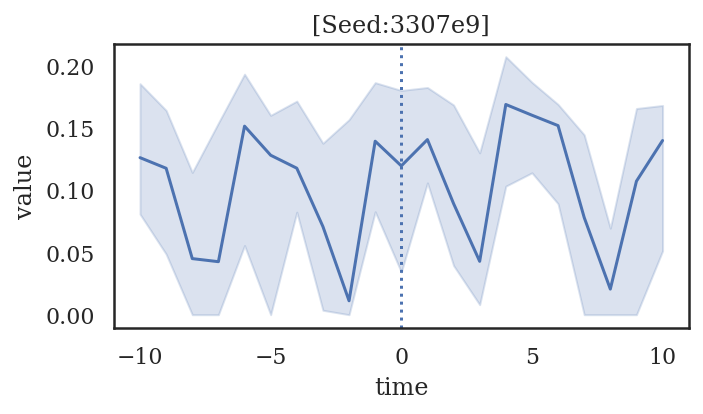

In [44]:
snip_df = tts_df.query("entered_search_mode == False")
# # snip_df = tts_df.query("entered_search_mode == True")
# snip_df = tts_df
# print( snip_df.shape )
# for i in range(snip_df.shape[0]):
#     plt.plot(snip_df['speed_snippet'].iloc[i])
# plt.show()

# Doesnt handle different sized speed_snippets (ie. end early)
# trajs = []
# for idx, row in snip_df.iterrows():
#     trajs.append(pd.DataFrame({
# #         'idx': idx,
#         'step': row['speed_snippet'],
#         'time': np.arange(-snippet_window, snippet_window+1, dtype=int).tolist(),
#      }))
# trajs = pd.concat(trajs)
# trajs

# Does handle different lengths
plt.figure(figsize=(5,3))
trajs = pd.DataFrame(snip_df['speed_snippet'].to_list())
trajs_melted = trajs.melt()
trajs
trajs_melted['time'] = trajs.shape[0] * np.arange(-snippet_window, snippet_window+1, dtype=int).tolist()
trajs_melted
# trajs_melted = trajs_melted.query("time > ")
sns.lineplot(data=trajs_melted, x='time', y='value', estimator=np.median, ci=68)
ax = plt.gca()
ax.axvline(x=0, ls=':')
plt.title(f"[Seed:{model_seed}]")
plt.tight_layout()
plt.savefig(f"{outdir}/tts_step_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
plt.show()


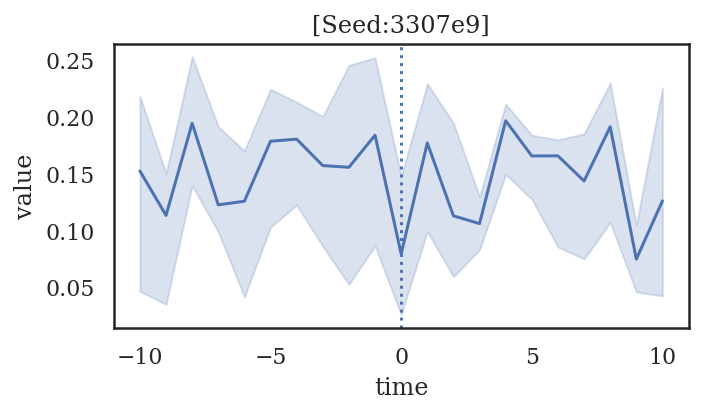

In [45]:
snip_df = ttc_df
# print( snip_df.shape )
# for i in range(snip_df.shape[0]):
#     plt.plot(snip_df['speed_snippet'].iloc[i])
# plt.show()

plt.figure(figsize=(5,3))
trajs = pd.DataFrame(snip_df['speed_snippet'].to_list())
trajs_melted = trajs.melt()
trajs
trajs_melted['time'] = trajs.shape[0] * np.arange(-snippet_window, snippet_window+1, dtype=int).tolist()
trajs_melted
# trajs_melted = trajs_melted.query("time > ")
sns.lineplot(data=trajs_melted, x='time', y='value', estimator=np.median, ci=68)
ax = plt.gca()
ax.axvline(x=0, ls=':')
plt.title(f"[Seed:{model_seed}]")
plt.tight_layout()
plt.savefig(f"{outdir}/ttc_step_{model_seed}.png", dpi=dpi_save, bbox_inches='tight')
plt.show()

## Limit Cycle Extraction

In [46]:
def get_period(ep_activity, search_start_idx=-50, max_period=50, plot=True):
    # Find finite-differences-period that is minimum
    diff_magnitudes = []
    for period in range(1, max_period):
        diff_trailing = pd.DataFrame(ep_activity[exit_idx:,:]).diff(periods=period).sum(axis=1)
        diff_trailing = diff_trailing.to_list()[search_start_idx:]
        diff_magnitudes.append( np.sum(np.abs(diff_trailing)) )
    period = np.argmin(diff_magnitudes) + 2
    
    if plot:
        pd.Series(diff_magnitudes).plot(figsize=(8,2))
        plt.axhline(y=0, c='grey', ls=':')
        plt.show()
    return period, diff_magnitudes

def get_lc_entry_idx(ep_activity, period, dist2lc_threshold=0.3):
    lc_activity = ep_activity[-period-2:,:]
    dist2lc = sp.spatial.distance.cdist(ep_activity, lc_activity)
    dist2lc = np.min(dist2lc, axis=1)
    dist2lc.shape

    pd.Series(dist2lc).plot(figsize=(8,2))
    plt.ylim(-0.5, 1)
    
    lc_entry_idx = np.argmax(dist2lc < dist2lc_threshold)
    plt.axhline(y=dist2lc_threshold, c='grey', ls=':')
    plt.axhline(y=0, c='grey', ls='-')
    plt.show()
    return lc_entry_idx

def plot_lc(pca_common, ep_activity, period, idx):
    fig = plt.figure(figsize=pca3d_figsize)
    ax = fig.gca(projection='3d')

    # Plot whole neural trajectory 
    X_pca = pca_common.transform(ep_activity)
    ax.plot(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], linewidth=1.0, c='grey', alpha=1.0)
    ax.scatter(X_pca[0, 0], X_pca[0, 1], X_pca[0, 2], c='black', marker='o', s=100) # Start
    ax.scatter(X_pca[-1, 0], X_pca[-1, 1], X_pca[-1, 2], c='black', marker='x', s=200) # End

    # Plot one
    LC_pca = pca_common.transform(ep_activity[-period:,:])
    ax.plot(LC_pca[:, 0], LC_pca[:, 1], LC_pca[:, 2], linewidth=2.0, c='red', alpha=1.0)

    # ax.plot(X_pca[exit_idx:lc_entry_idx, 0], 
    #         X_pca[exit_idx:lc_entry_idx, 1], 
    #         X_pca[exit_idx:lc_entry_idx, 2], 
    #         linewidth=1.0, c='blue', alpha=1.0)

    # ax.plot(X_pca[lc_entry_idx:, 0], X_pca[lc_entry_idx:, 1], X_pca[lc_entry_idx:, 2], linewidth=0.4, c='red', alpha=1.0)


    ax.set_xlabel(f'PC1 (VarExp: {pca_common.explained_variance_ratio_[0]:0.2f})')
    ax.set_ylabel(f'PC2 (VarExp: {pca_common.explained_variance_ratio_[1]:0.2f})')
    ax.set_zlabel(f'PC3 (VarExp: {pca_common.explained_variance_ratio_[2]:0.2f})')

    plt.title(f'Idx:{idx} Period:{period} [Seed:{model_seed}]')
    plt.tight_layout()
    fname = f"{outdir}/limitcycle_{model_seed}_{idx}.png"
    print("Saving:", fname)
    plt.savefig(fname, dpi=dpi_save, bbox_inches='tight')
    plt.show()

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


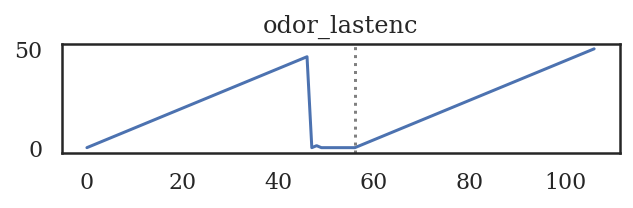

constantx5b5


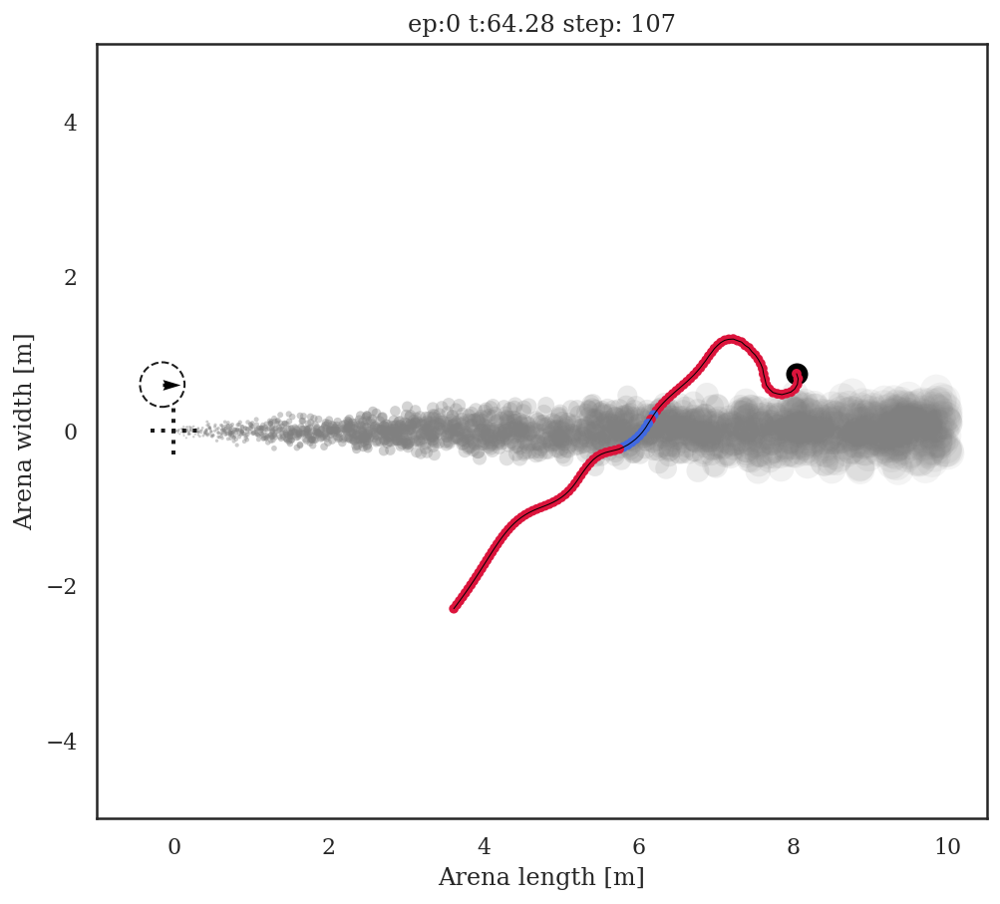

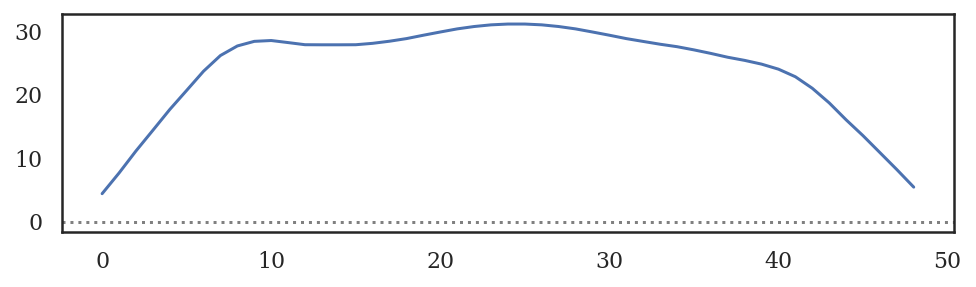

2 4.40496714040637 0


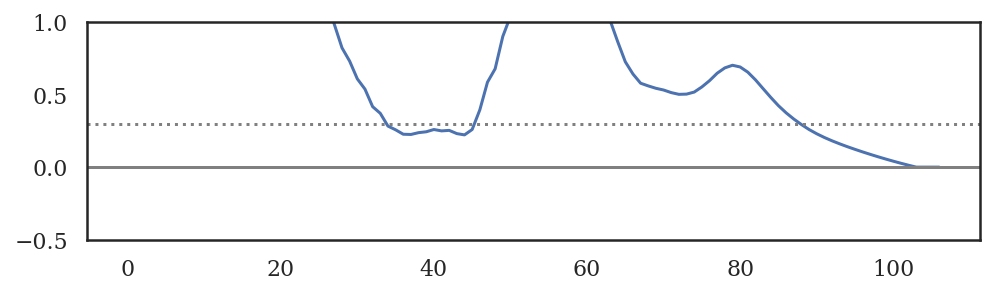

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_199.png


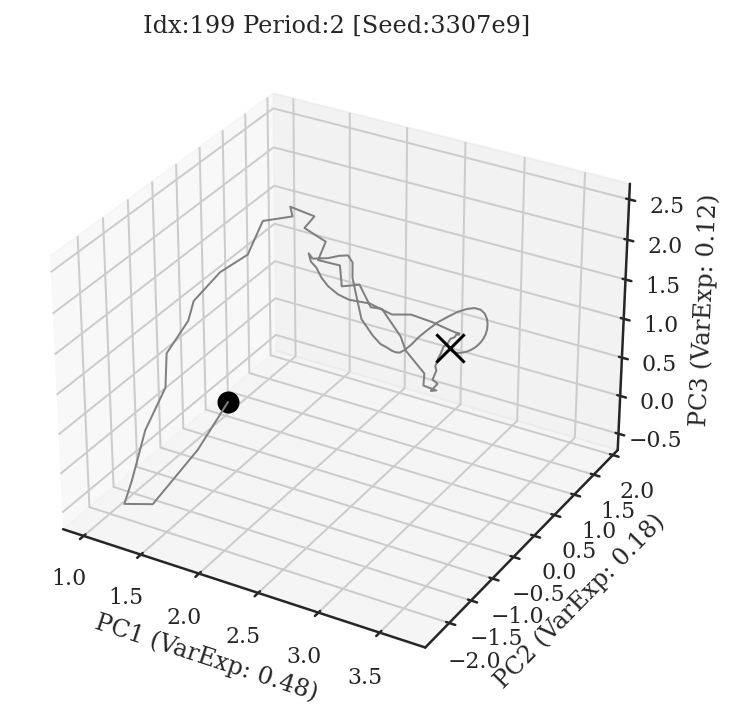

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


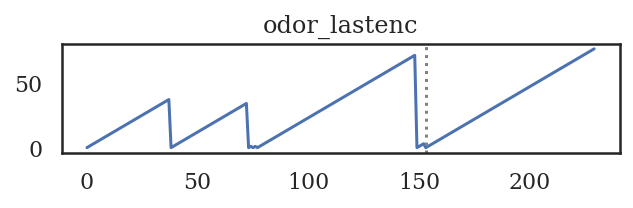

switch45x5b5


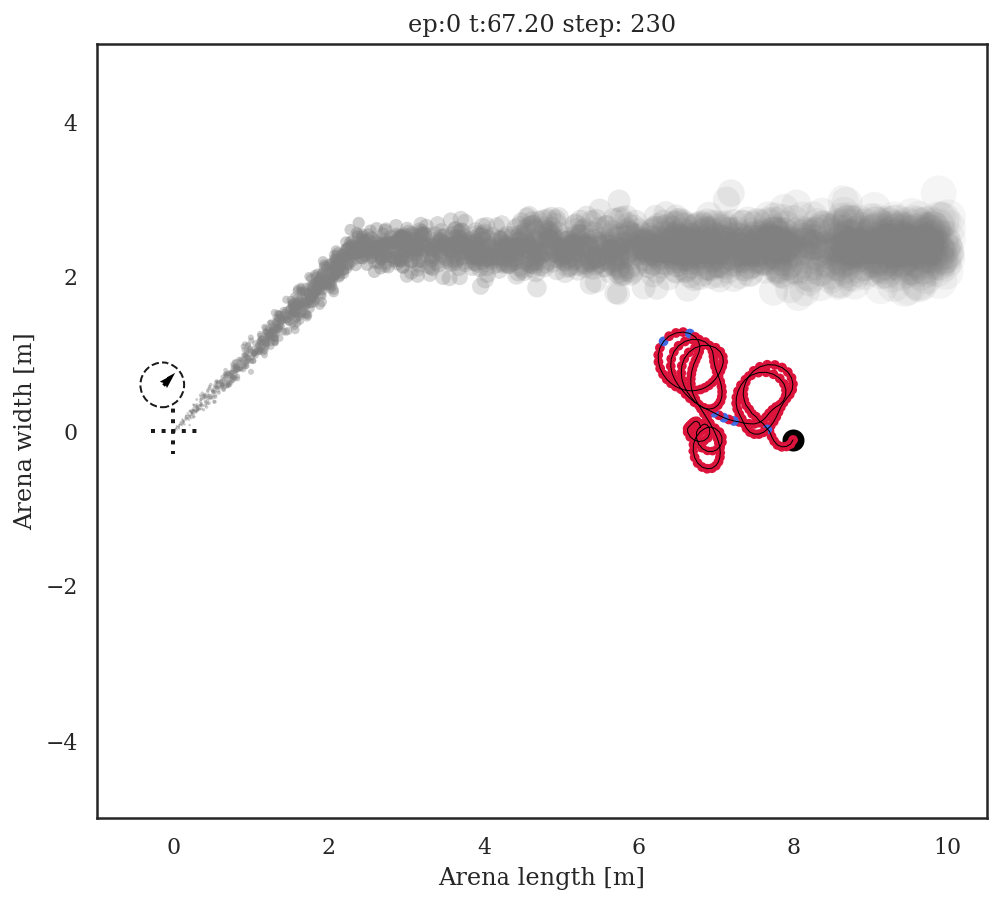

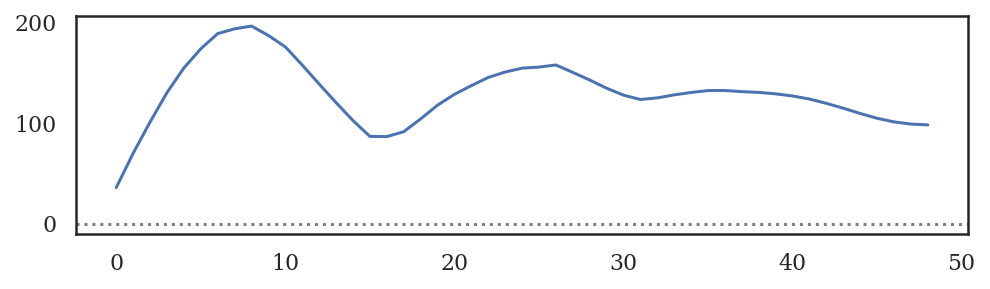

2 35.91429591178894 0


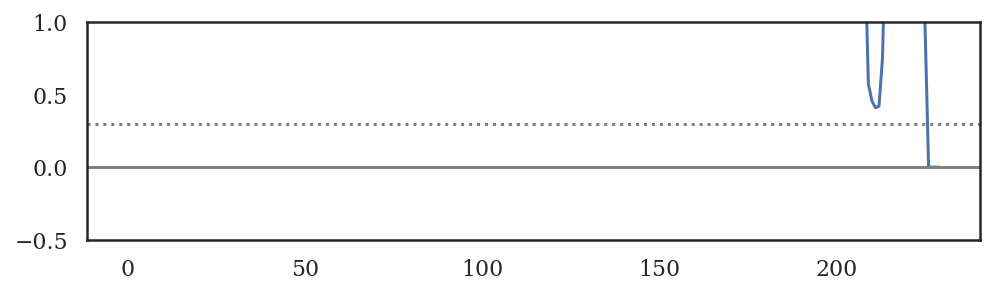

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_192.png


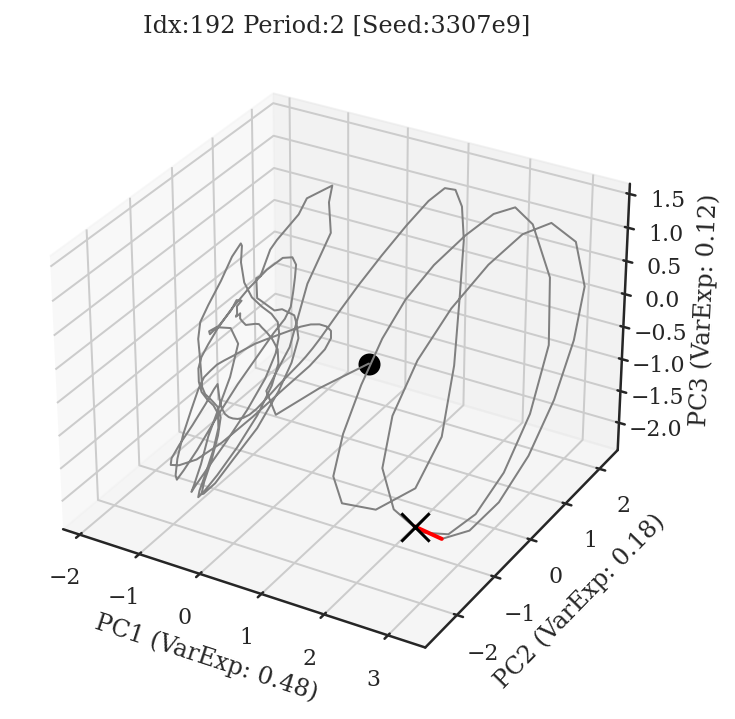

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


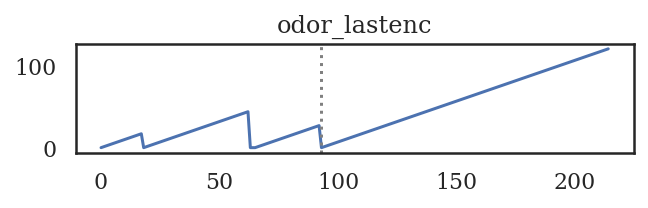

switch45x5b5


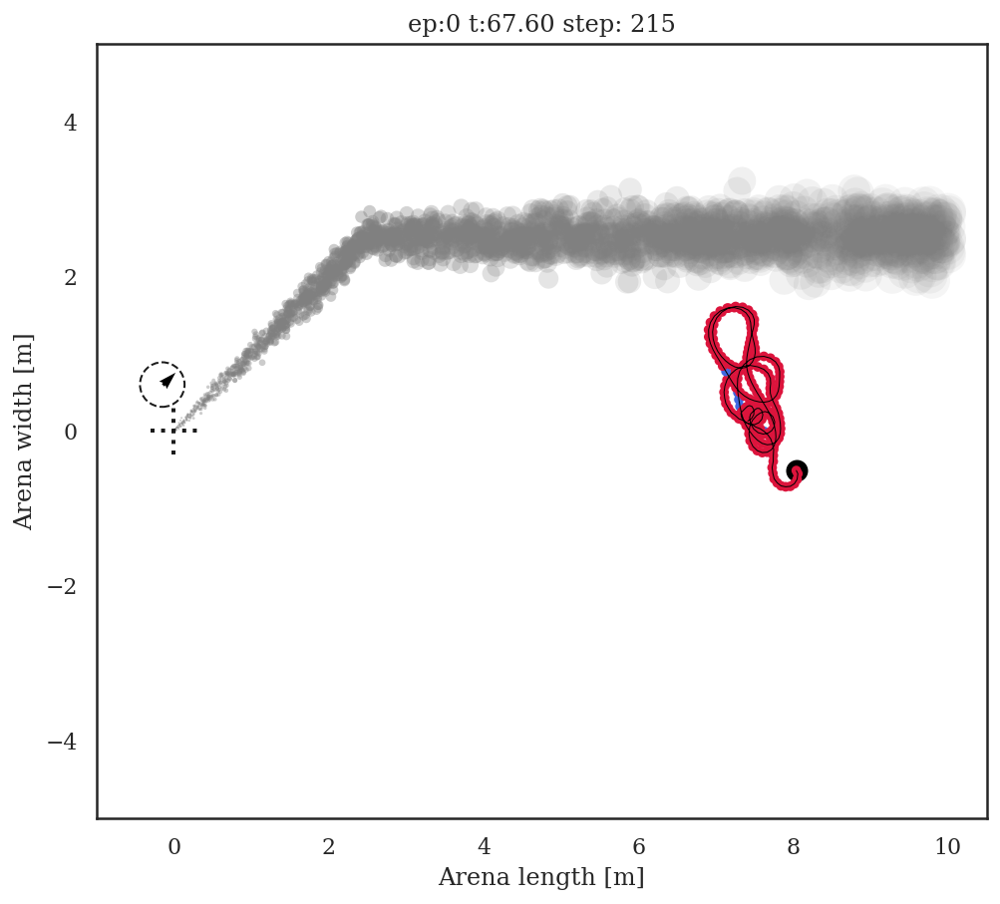

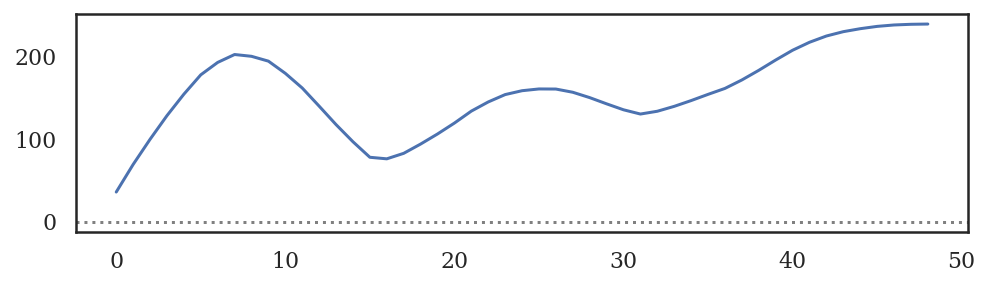

2 35.95453529059887 0


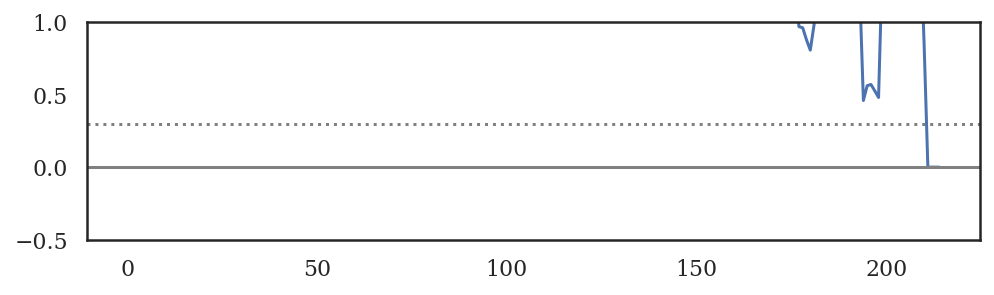

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_235.png


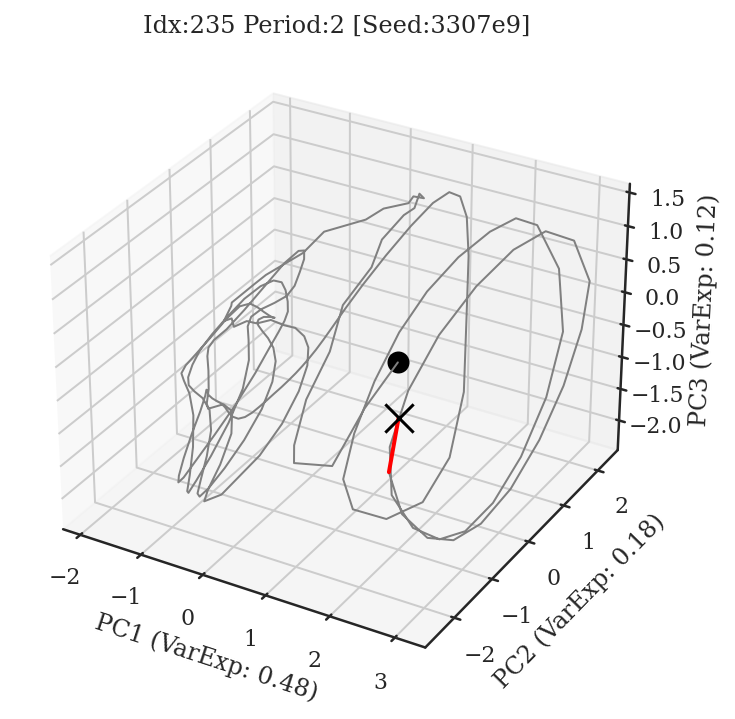

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


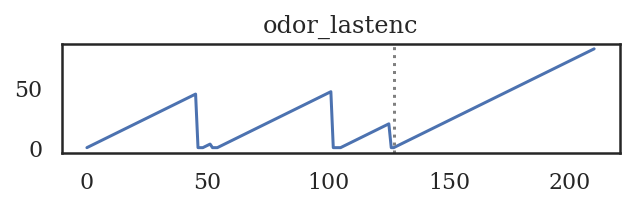

switch45x5b5


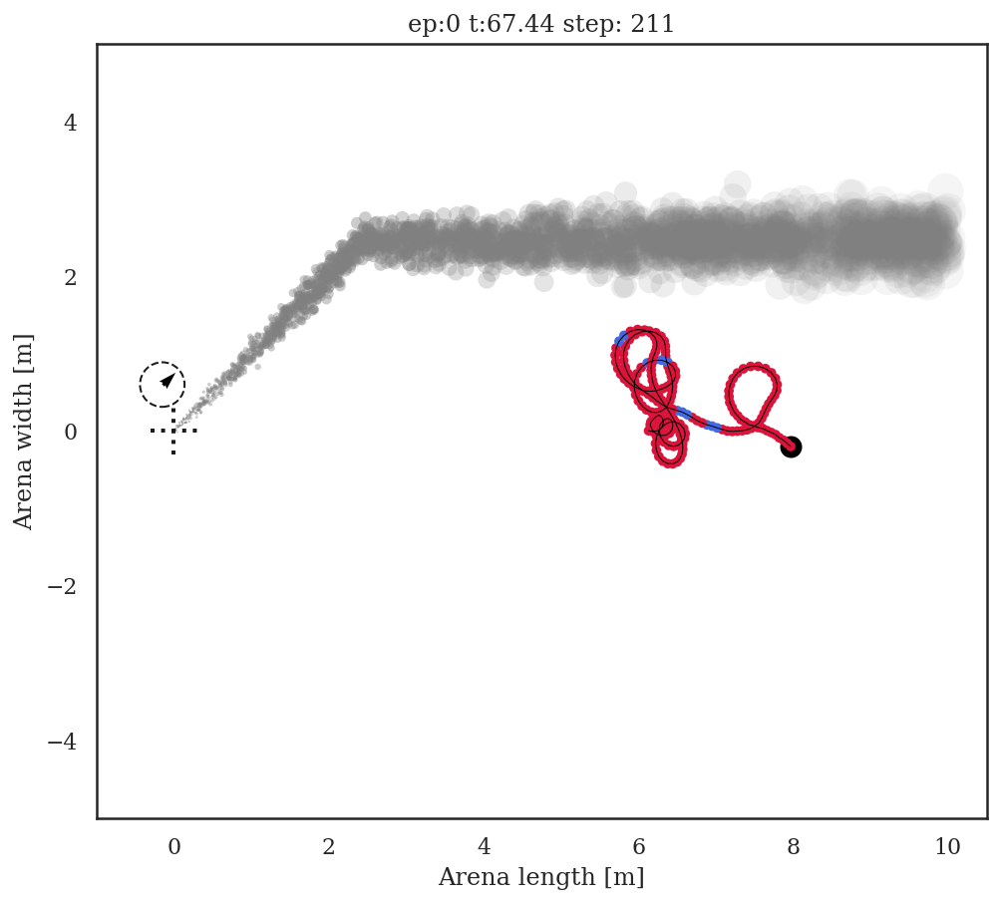

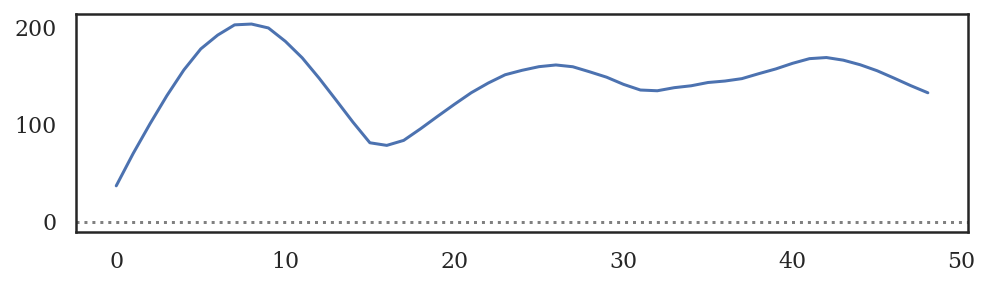

2 36.9818624407053 0


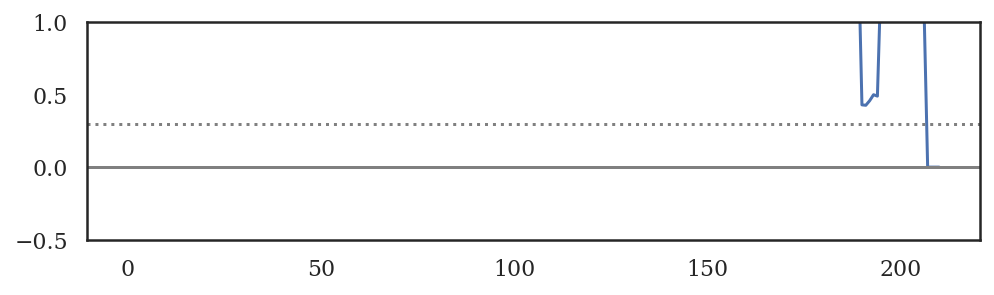

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_216.png


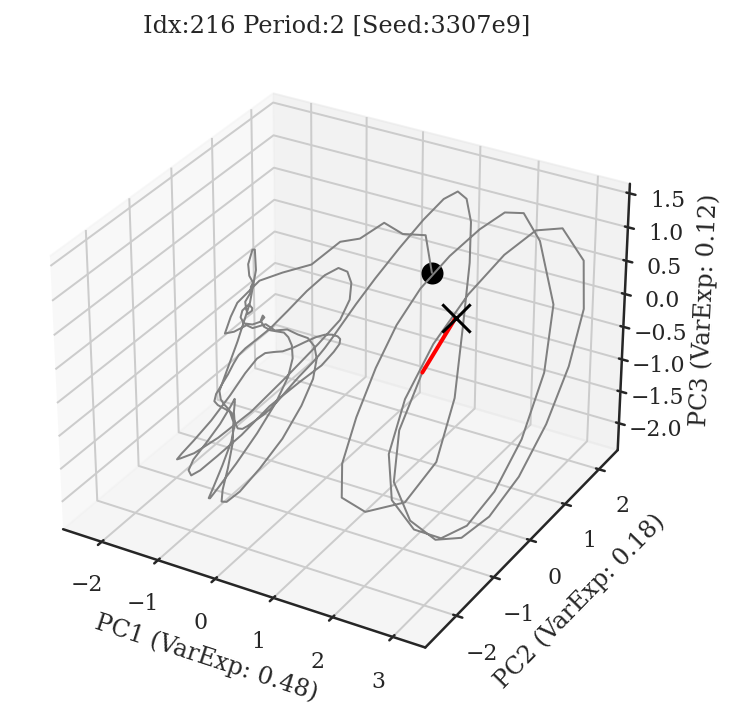

seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35
seed specific thresholds 12 35


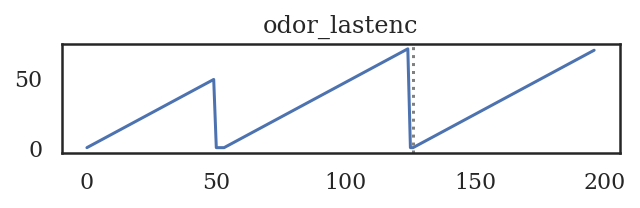

switch45x5b5


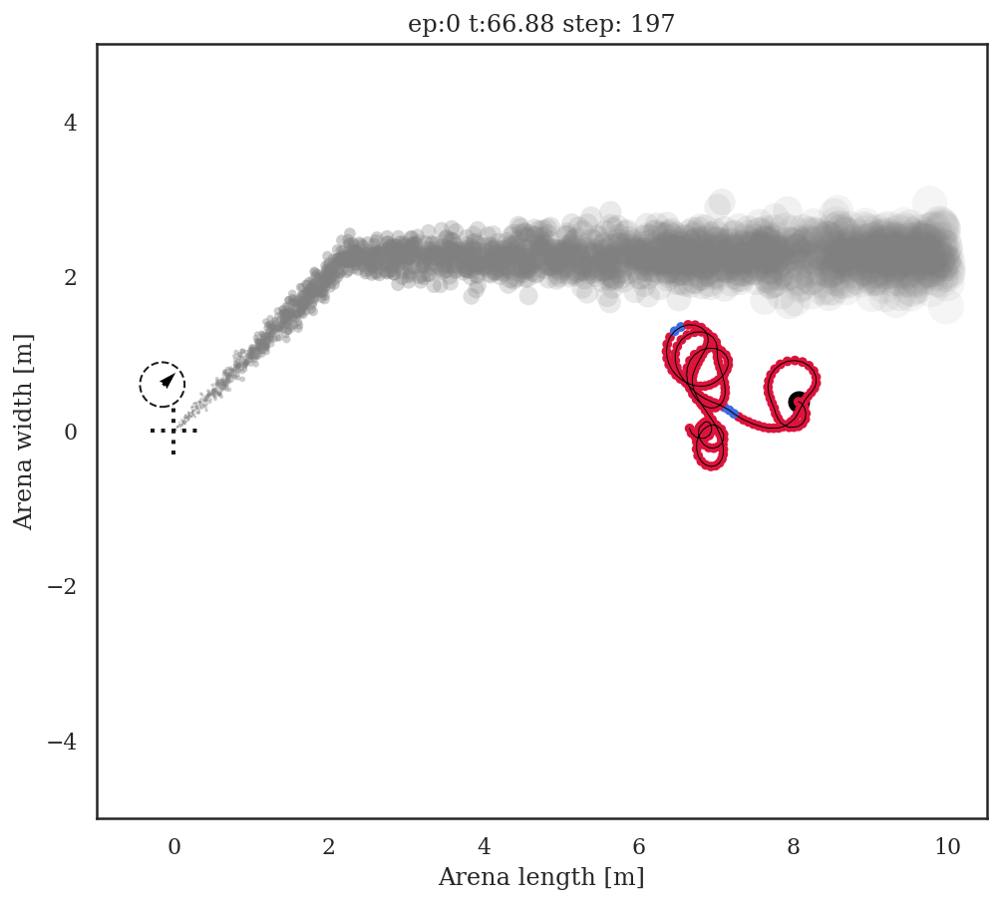

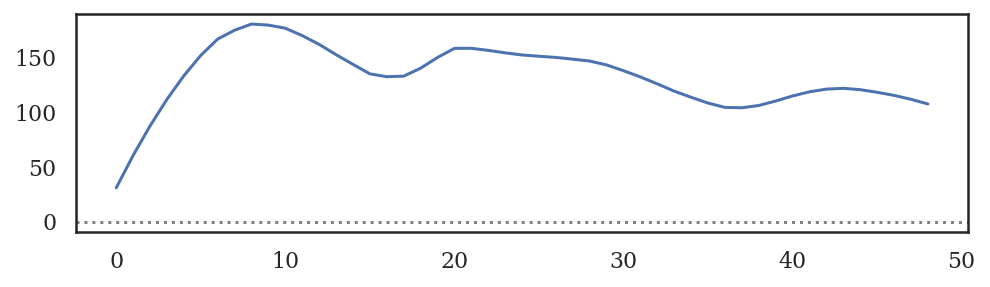

2 30.893570594489574 0


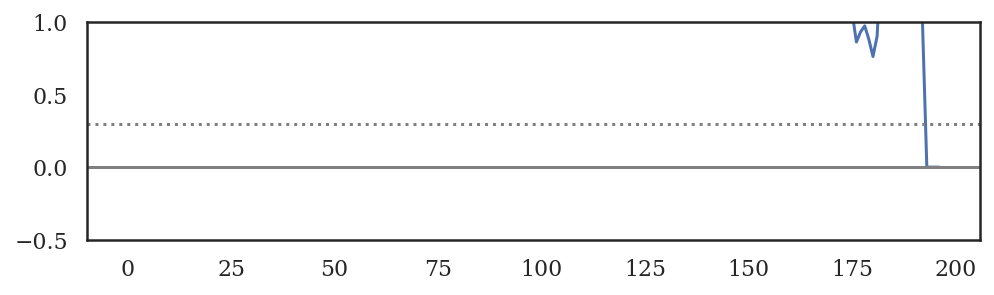

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_204.png


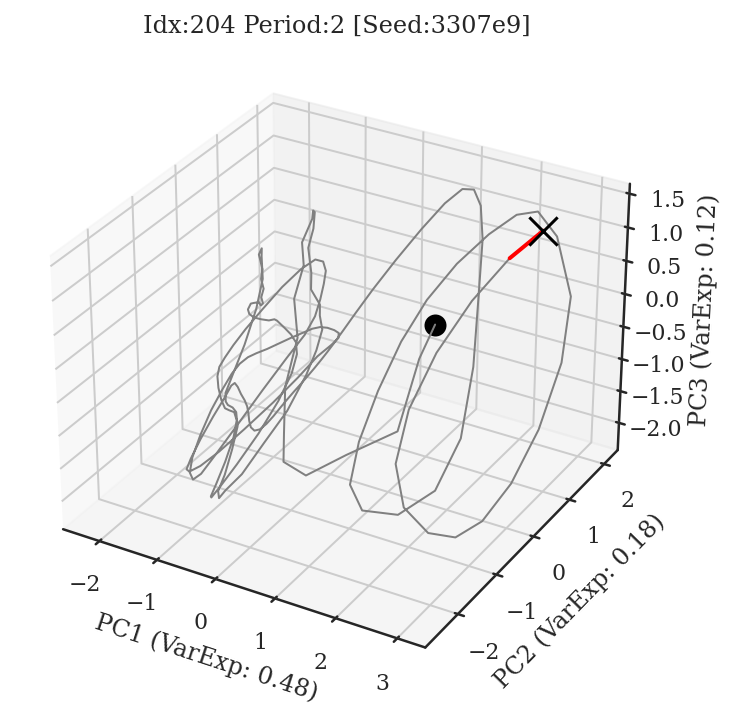

seed specific thresholds 12 35
seed specific thresholds 12 35


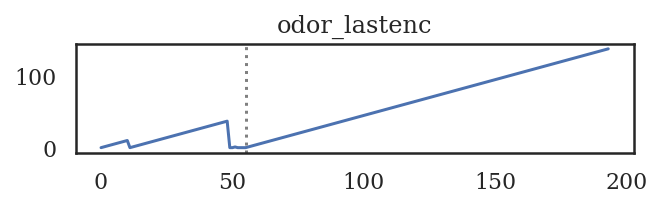

switch45x5b5


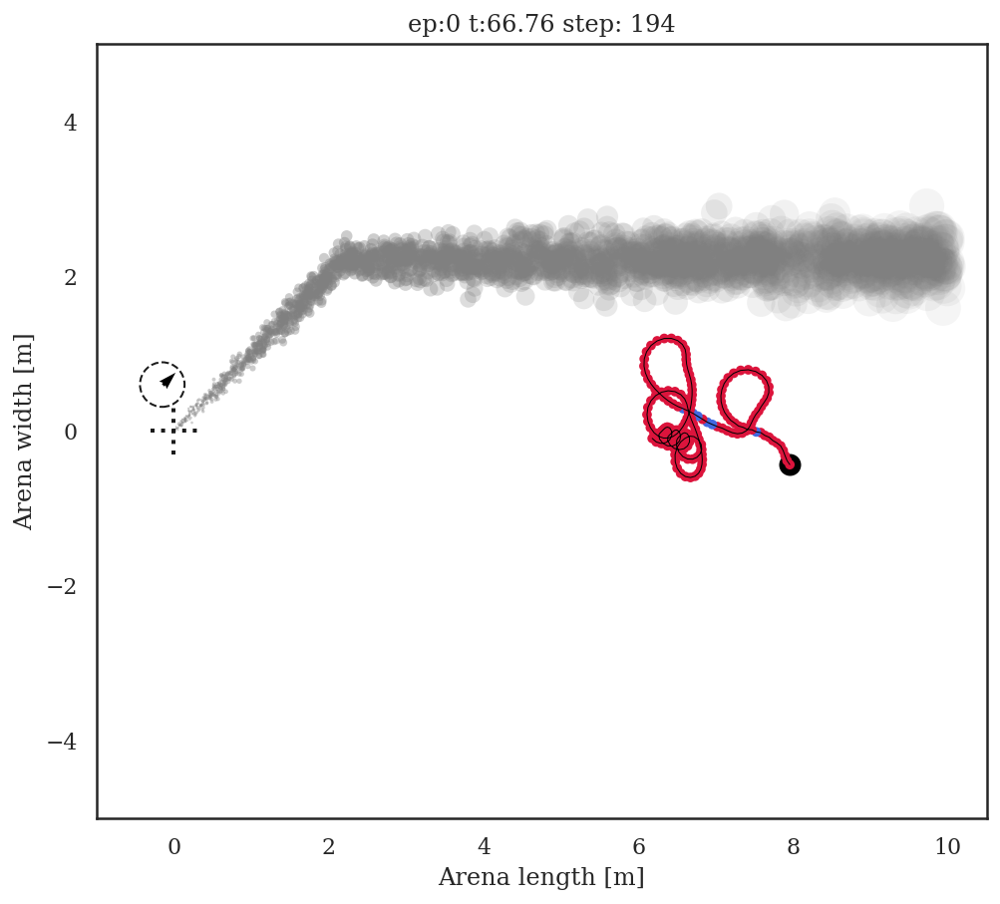

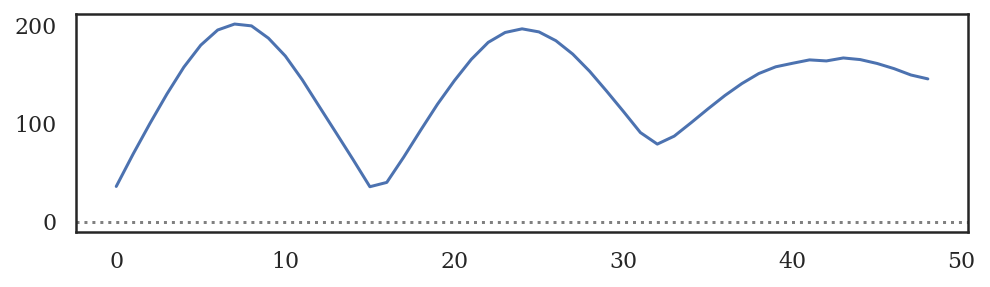

17 35.61729519814253 15


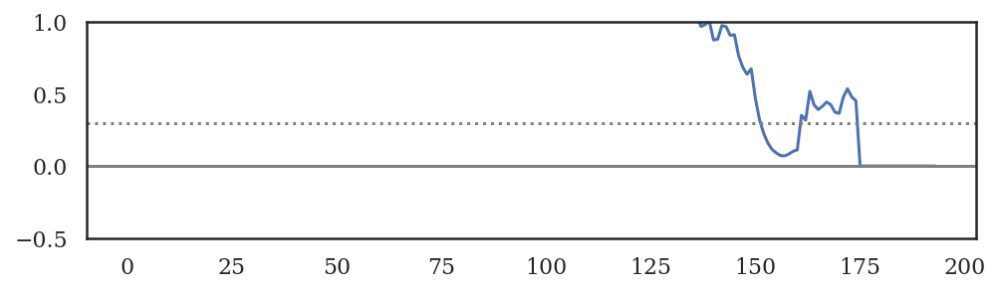

Saving: /home/satsingh/plume/plumezoo/latest/fly/memory/plume_20210601_VRNN_constantx5b5noisy3x5b5_stepoob_bx0.30.8_t10000004000000_q2.00.5_dmx0.80.8_dmn0.70.4_h64_wd0.0001_n4_codeVRNN_seed3307e9//report_common_subspace//limitcycle_3307e9_220.png


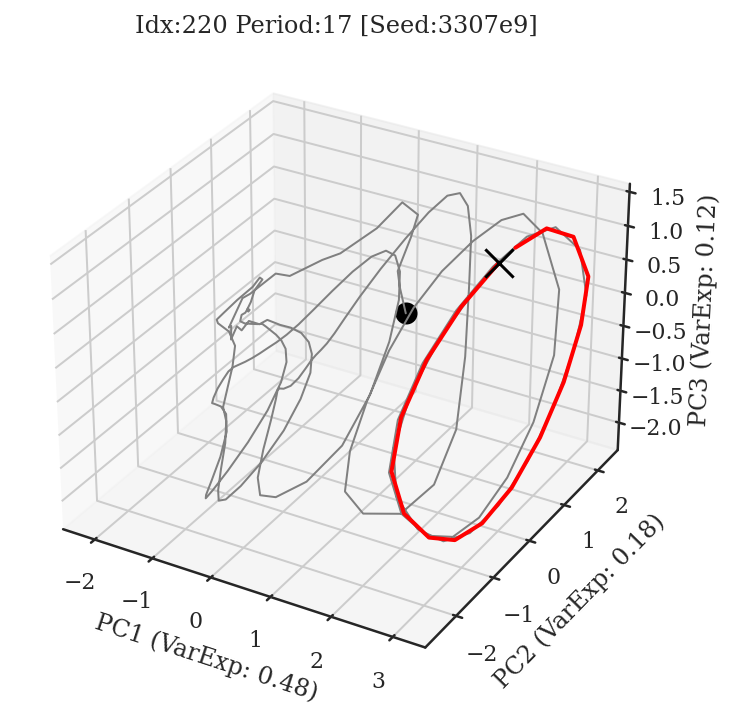

In [47]:
# Find episodes that end in casting (OOB)
# Find time from last_enc=0 to entry into OOB-centroid-range
# However, should have encountered plume for a few timesteps

outcome = 'OOB'
# datasets = ['constantx5b5']
datasets = ['constantx5b5', 'switch45x5b5']
num_to_plot = 5
# datasets = use_datasets
to_plot = []
# to_plot = ['distances']
# to_plot = ['distances', 'trajectories']
for idx, row in selected_df.query("outcome == @outcome and dataset in @datasets ").iterrows():
    outcome = row['outcome']
    ep_activity = log_analysis.get_activity(row['log'], is_recurrent, do_plot=False)
    traj_df = log_analysis.get_traj_df(row['log'], 
            extended_metadata=False, squash_action=False, seed=model_seed)
    
    if sum(traj_df.odor_lastenc == 0) > 5: # encountered plume at least 1/10th sec
        home_distances = np.linalg.norm(ep_activity - hx_centroids['HOME'], axis=1)
        oob_distances = np.linalg.norm(ep_activity - hx_centroids['OOB'], axis=1)

        exit_idx = len(traj_df.odor_01) - pd.Series(traj_df.odor_01).iloc[::-1].argmax()

        # when in OOB range
        oob_idx = pd.Series(oob_distances > centroid_ranges[outcome])
        oob_idx[:exit_idx] = True
        oob_idx = oob_idx.argmin()
        
        ep_len = traj_df.shape[0]
        if exit_idx > ep_len - 12: # Exclude trajectories where exits only at last 0.5s 
            continue
            
        ttc = oob_idx - exit_idx
        if ttc <= 0: # invalid
            continue

        pd.Series(traj_df.odor_lastenc).plot(figsize=(5, 1), title='odor_lastenc')
        plt.axvline(x=exit_idx, c='grey', ls=':')
        plt.show()
        
        agent_analysis.visualize_episodes([row['log']], 
                          zoom=2, 
                          dataset=row['dataset'],
                          animate=False,
                         )
        plt.show()

        period, diff_magnitudes = get_period(ep_activity, search_start_idx=-50, max_period=50, plot=True)
        print(period, np.min(diff_magnitudes), np.argmin(diff_magnitudes))
        
        lc_entry_idx = get_lc_entry_idx(ep_activity, period, dist2lc_threshold=0.3)

        idx = row['idx']
        plot_lc(pca_common, ep_activity, period, idx)
        
        if num_to_plot <= 0:
            break
        else:
            num_to_plot -= 1



In [48]:
traj_df['odor_01'].value_counts()

0    187
1      7
Name: odor_01, dtype: int64

In [49]:
span = 3
pd.Series([0,0,0,1,1,1,0,0,0,0,1,1,0]).diff().clip(lower=0).ewm(span=span).mean()
# .apply(lambda x: 1 if x > 0 else 0)

0          NaN
1     0.000000
2     0.000000
3     0.571429
4     0.266667
5     0.129032
6     0.063492
7     0.031496
8     0.015686
9     0.007828
10    0.504399
11    0.252076
12    0.126007
dtype: float64

In [50]:
colorby = 'odor_ma_46'
'_'.join( colorby.split('_')[:-1] )

'odor_ma'